# Energy spectra in 3D in time
In this notebook the performance of the 3D spectra in time and space is done. For running this python notebook you need a time series of $\eta(x,yt)$ with shape $(N_t,N,N)$. Look into **create_etafile.ipynb** for the creation of this time series. 

In [1]:
import gc
import os
import sys
import warnings
import math as m

# Paths
sys.path.extend([
    '/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence',
    '/projects/DEIKE/cmartinb/functions',
])

# Work directory
os.chdir('/projects/DEIKE/cmartinb/')

# Remove warnings about time
warnings.filterwarnings("ignore", category=RuntimeWarning)

import numpy as np
import pandas as pd
import pylab
import scipy
from scipy import stats
import scipy.interpolate
from scipy.signal import butter, filtfilt, find_peaks, hilbert

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import matplotlib.tri as mtri
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D

# Own modules

from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import *
from branches import *

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.signal import find_peaks


import numpy as np
import scipy.interpolate
from scipy.interpolate import RegularGridInterpolator
import multiprocessing as mp
import time

from spectrum_utils import (
    pol2cart,
    process_subdivision,
    spectrum3D_subdivisions_parallel
)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from scipy.signal import find_peaks

import numpy as np
import scipy.interpolate
from scipy.interpolate import RegularGridInterpolator
import multiprocessing as mp
import time


## Common parameters 

In [2]:
params = {'legend.fontsize': 'xx-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)

## Define case

In [3]:
kpHs = '0p08' # 0p16 
uoc = '0p50' # 0p50 0p75
reW = '2.5e4' #1.0e5
reA = 720
maxLevel = 10 #11
Bo=200 # 1000,25

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

if uoc == '0p75':
    N = 1024
else:
    N = 512 

if maxLevel== 11:
    N = 1024
else:
    N = 512 

#Common parameters 
kp = 4
u = 0.25
lambdap = 2*m.pi/kp

rho1 = 1
rho2 = 1.25*10**(-3)

L0 = 2*np.pi;

ak,  c, omegap, nu_water, g, uoc_val, sigma, Tp= calculate_parameters(kpHs, uoc , u ,kp, Bo, rho1, rho2)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)

ak is 0.08 c is 0.5 w_p$ is 2.0 $
u_w$ is 3.141592653589793e-05 g is 0.9950310636260177 N 512


In [4]:
work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
#work_dir = f'/projects/DEIKE/cmartinb/cases_multiphase_broadbanded/re{reA}_bo{Bo}_kpHs{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'

data = np.loadtxt(work_dir+'eta/global_int.out')
istep_c =data[:, 1]
t = data[:,0] 
print(t.shape)

(1731,)


### Creation directory and path for graphs 3D spectra

In [5]:
graph_path = f'/projects/DEIKE/cmartinb/notebooks/graphs/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/growth_rates/3Dspace_time/'
if not os.path.exists(graph_path):
    os.makedirs(graph_path)

### Load eta series

In [6]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
print(eta_series.shape)
print(t.shape)

(1731, 512, 512)
(1731,)


#### Load the time and select times where energy grows

In [7]:
tstart = t[0]
indice = np.argmax(omegap*(t - tstart) > 5)
print(indice)

eta_series_trimmed = eta_series[indice:, :]

print(eta_series_trimmed.shape)
t = t[indice:]

eta_series = eta_series_trimmed
print(t.shape)

26
(1705, 512, 512)
(1705,)


In [8]:
print(eta_series.shape[1])
data = eta_series

ln = 150 #interval length 
N = N
ak = ak
DataEta = eta_series
t = t

512


#### Function that execute the 3D spectrum with overlap of $50\%$. The function **spectrum3D_subdivisions_parallel** can be found in spectrum_utils.py

In [9]:
'''
def pol2cart(r, theta):
    """Convierte coordenadas polares a cartesianas."""
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    return x, y

def process_subdivision(args):
    """
    Procesa una subdivisión del conjunto de datos.
    
    Parámetros:
      - start_idx: índice de inicio de la subdivisión.
      - ln: longitud de la subdivisión.
      - DataEta: arreglo 3D (tiempo, y, x) de datos.
      - time: vector de tiempos.
      - N: número de puntos espaciales.
      - ak: valor usado para el factor de normalización.
      - zero_padding: bool para aplicar zero-padding.
      - CHECK: bool para imprimir información de control.
      - normalization_factor: factor de normalización, si ya se calculó.
    """
    start_idx, ln, DataEta, time, N, ak, zero_padding, CHECK, normalization_factor = args
    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    end_idx = start_idx + ln
    if end_idx > len(DataEta):
        return None  # Se ignora subdivisión incompleta
    
    # Extraer la subdivisión
    time_subdivision = np.array(time[start_idx:end_idx])
    data_subdivision = np.array(DataEta[start_idx:end_idx])
    kpHs = 4 *kp* np.sqrt(np.var(data_subdivision))

    if CHECK:
        print(kpHs)
        print(f"Procesando subdivisión desde {start_idx} hasta {end_idx}. Varianza: {np.var(data_subdivision)}")
    
    # Aplicar ventana de Hann de forma vectorizada (broadcasting)
    hann_window = np.hanning(ln)[:, None, None]  # Redimensiona a (ln,1,1)
    data_subdivision *= hann_window
    
    # Aplicar zero-padding si se requiere
    if zero_padding:
        padding_length = 200  # Ajusta este valor según necesidad
        data_subdivision = np.pad(data_subdivision, ((0, padding_length), (0,0), (0,0)), mode='constant')
    
    dt = time_subdivision[1] - time_subdivision[0]
    L0 = 2 * np.pi
    dx = L0 / N
    dy = L0 / N
    
    # Calcular frecuencias y números de onda
    omega = 2 * np.pi * np.fft.fftshift(np.fft.fftfreq(data_subdivision.shape[0], dt))
    wavenumber = 2 * np.pi * np.fft.fftfreq(N, L0 / N)
    theta = np.linspace(0, 2 * np.pi, N)
    kx = np.fft.fftshift(wavenumber)
    ky = kx.copy()
    k = wavenumber[:int(N/2)]

    # Realizar la FFT 3D
    spectrum3D = np.fft.fftn(data_subdivision) * np.sqrt(ln) / np.sqrt(N**2)
    spectrum3D = np.fft.fftshift(spectrum3D, axes=(0, 1, 2))
    F_3D = (np.abs(spectrum3D))**2 / (N * N)
    
    # Calcular el espectro de amplitud
    amplitudes = np.sqrt(np.real(spectrum3D)**2 + np.imag(spectrum3D)**2) * np.sqrt(ln * N**2)
    rms_amplitude = np.sqrt(np.mean(amplitudes**2))
    
    # Calcular el factor de normalización (en la primera subdivisión)
    if normalization_factor is None:
        k_index_arr = np.where(np.isclose(k, 4))[0]
        if k_index_arr.size > 0:
            k_index = k_index_arr[0]
            amplitude_k4 = amplitudes[0, 0, k_index]
            normalization_factor = ak / amplitude_k4 if amplitude_k4 != 0 else 1
            if CHECK:
                print(f"Normalization factor computed: {normalization_factor}")
        else:
            normalization_factor = 1
            if CHECK:
                print("k=4 not found, using normalization factor = 1")
    
    amplitudes *= normalization_factor
    
    # Preparar grillas para la interpolación
    kx_tile, ky_tile = np.meshgrid(kx, ky)      # Grilla en kx-ky (regular)
    k_tile, theta_tile = np.meshgrid(k, theta)    # Grilla en k-theta
    kxp_tile, kyp_tile = pol2cart(k_tile, theta_tile)
    Omega, K_grid = np.meshgrid(omega, k)
    
    # Inicializar listas para almacenar resultados para cada frecuencia (dimensión temporal de la FFT)
    F_xy_interval = []
    F_komega_interval = []
    F_ktheta_interval = []
    amplitudes_k_interval = []
    u_sf_k_interval = []  # Placeholder para futuros cálculos
    
    dtheta = theta[1] - theta[0] if len(theta) > 1 else 1
    
    # Para cada frecuencia, interpolar F_xy a F_ktheta usando RegularGridInterpolator
    for idx in range(data_subdivision.shape[0]):
        F_xy = F_3D[idx]  # Array 2D correspondiente a la frecuencia idx
        interp_func = RegularGridInterpolator((ky, kx), F_xy, method='nearest')
        points = np.column_stack((kyp_tile.ravel(), kxp_tile.ravel()))
        F_ktheta = interp_func(points).reshape(kxp_tile.shape)
        F_komega = np.sum(F_ktheta * k_tile, axis=0) * dtheta  # Integración sobre theta
        
        F_xy_interval.append(F_xy)
        F_komega_interval.append(F_komega)
        F_ktheta_interval.append(F_ktheta)
        u_sf_k_interval.append(np.zeros(len(k), dtype=complex))  # Si se requiere calcular
        
        amplitudes_k = np.sqrt(np.sum(np.abs(F_ktheta)**2, axis=0) * dtheta)
        amplitudes_k_interval.append(amplitudes_k)
        
        if CHECK:
            dkx = np.abs(kx[1]-kx[0]) if len(kx) > 1 else 1
            dky = np.abs(ky[1]-ky[0]) if len(ky) > 1 else 1
            domega = np.abs(omega[1]-omega[0]) if len(omega) > 1 else 1
            print(f"Freq index {idx} in subdivision {start_idx}-{end_idx}: sum(F_xy)*dkx*dky*domega = {np.sum(F_xy)*dkx*dky*domega}")
    
    result = {
        'start_idx': start_idx,
        'omega': omega,
        'eta_time': data_subdivision,
        'F_xy_interval': F_xy_interval,
        'F_komega_interval': F_komega_interval,
        'F_ktheta_interval': F_ktheta_interval,
        'amplitudes': amplitudes,
        'amplitudes_k_interval': amplitudes_k_interval,
        'rms_amplitude': rms_amplitude,
        'k': k,
        'kx': kx,
        'kx_tile': kx_tile,
        'ky_tile': ky_tile,
        'k_tile': k_tile,
        'theta_tile': theta_tile,
        'Omega': Omega,
        'K': K_grid,
        'normalization_factor': normalization_factor,
        'kpHs':kpHs
    }
    return result

def spectrum3D_subdivisions_parallel(DataEta, time, ln, N, ak, zero_padding=True, CHECK=False):
    """
    Procesa los datos en subdivisiones (superposición del 50%) de forma paralela.
    Devuelve los resultados consolidados.
    """
    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    indices = list(range(0, len(DataEta) - overlap, ln - overlap))
    if len(indices) == 0:
        raise ValueError("No se encontraron subdivisiones válidas.")
    
    # Procesar la primera subdivisión secuencialmente para obtener el normalization_factor
    first_args = (indices[0], ln, DataEta, time, N, ak, zero_padding, CHECK, None)
    first_result = process_subdivision(first_args)
    normalization_factor = first_result['normalization_factor']
    
    results = [first_result]
    args_list = []
    for idx in indices[1:]:
        args_list.append((idx, ln, DataEta, time, N, ak, zero_padding, CHECK, normalization_factor))
    
    if args_list:
        with mp.Pool(processes=mp.cpu_count()) as pool:
            parallel_results = pool.map(process_subdivision, args_list)
        parallel_results = [res for res in parallel_results if res is not None]
        results.extend(parallel_results)
    
    # Consolidar resultados en listas
    all_F_xyomega = [res['F_xy_interval'] for res in results]
    all_F_komega = [res['F_komega_interval'] for res in results]
    all_F_ktheta = [res['F_ktheta_interval'] for res in results]
    all_amplitudes = [res['amplitudes'] for res in results]
    all_amplitudes_k = [res['amplitudes_k_interval'] for res in results]
    eta_time_list = [res['eta_time'] for res in results]
    all_kpHs = [res['kpHs'] for res in results]

    
    # Extraer los arreglos globales del primer resultado (asumidos constantes)
    k = results[0]['k']
    omega = results[0]['omega']
    k_tile = results[0]['k_tile']
    theta_tile = results[0]['theta_tile']
    kx = results[0]['kx']
    kx_tile = results[0]['kx_tile']
    ky_tile = results[0]['ky_tile']
    Omega = results[0]['Omega']
    K_grid = results[0]['K']
    
    return (k, omega, k_tile, theta_tile, kx, kx_tile, ky_tile,
            all_F_xyomega, all_F_komega, Omega, K_grid, all_F_ktheta, eta_time_list,
            all_amplitudes, all_amplitudes_k, all_kpHs)
'''

'\ndef pol2cart(r, theta):\n    """Convierte coordenadas polares a cartesianas."""\n    x = r * np.cos(theta)\n    y = r * np.sin(theta)\n    return x, y\n\ndef process_subdivision(args):\n    """\n    Procesa una subdivisión del conjunto de datos.\n    \n    Parámetros:\n      - start_idx: índice de inicio de la subdivisión.\n      - ln: longitud de la subdivisión.\n      - DataEta: arreglo 3D (tiempo, y, x) de datos.\n      - time: vector de tiempos.\n      - N: número de puntos espaciales.\n      - ak: valor usado para el factor de normalización.\n      - zero_padding: bool para aplicar zero-padding.\n      - CHECK: bool para imprimir información de control.\n      - normalization_factor: factor de normalización, si ya se calculó.\n    """\n    start_idx, ln, DataEta, time, N, ak, zero_padding, CHECK, normalization_factor = args\n    overlap_factor = 0.5\n    overlap = int(ln * overlap_factor)\n    end_idx = start_idx + ln\n    if end_idx > len(DataEta):\n        return None  # Se i

In [10]:
import numpy as np
import multiprocessing as mp
from scipy.interpolate import RegularGridInterpolator

def pol2cart(r, theta):
    """Convert polar coordinates to Cartesian coordinates."""
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    return x, y

def process_subdivision(args):
    """
    Process a subdivision of the dataset.

    Parameters:
      - start_idx: starting index of the subdivision
      - ln: length of the subdivision
      - DataEta: 3D array of data (time, y, x)
      - time: array of time values
      - N: number of spatial points
      - ak: value used for the normalization factor
      - zero_padding: bool indicating whether to apply zero-padding
      - CHECK: bool for printing debug information
      - normalization_factor: existing normalization factor, or None to compute it

    Returns:
      A dictionary containing spectral and amplitude results for this subdivision,
      or None if the subdivision is incomplete.
    """
    start_idx, ln, DataEta, time, N, ak, zero_padding, CHECK, normalization_factor = args
    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    end_idx = start_idx + ln
    if end_idx > len(DataEta):
        return None  # Skip incomplete subdivision

    # Extract the time and data for this subdivision
    time_sub = np.array(time[start_idx:end_idx])
    data_sub = np.array(DataEta[start_idx:end_idx])
    kpHs = 4 * kp * np.sqrt(np.var(data_sub))

    if CHECK:
        print(f"kpHs: {kpHs}")
        print(f"Processing subdivision from {start_idx} to {end_idx}. Variance: {np.var(data_sub)}")

    # Apply a Hann window (vectorized via broadcasting)
    hann_window = np.hanning(ln)[:, None, None]  # Shape (ln, 1, 1)
    data_sub *= hann_window

    # Apply zero-padding if requested
    if zero_padding:
        padding_length = 200  # Adjust as needed
        data_sub = np.pad(data_sub,
                          ((0, padding_length), (0, 0), (0, 0)),
                          mode='constant')

    # Compute time and space resolutions
    dt = time_sub[1] - time_sub[0]
    L0 = 2 * np.pi
    dx = dy = L0 / N

    # Frequencies (temporal) and wavenumbers (spatial)
    omega = 2 * np.pi * np.fft.fftshift(np.fft.fftfreq(data_sub.shape[0], dt))
    wavenumber = 2 * np.pi * np.fft.fftfreq(N, L0 / N)
    theta = np.linspace(0, 2 * np.pi, N)
    kx = np.fft.fftshift(wavenumber)
    ky = kx.copy()
    k = wavenumber[:N // 2]

    # 3D FFT and power spectrum
    spectrum3D = np.fft.fftn(data_sub) * np.sqrt(ln) / np.sqrt(N**2)
    spectrum3D = np.fft.fftshift(spectrum3D, axes=(0, 1, 2))
    F_3D = np.abs(spectrum3D)**2 / (N * N)

    # Amplitude spectrum and RMS amplitude
    amplitudes = np.sqrt(np.real(spectrum3D)**2 + np.imag(spectrum3D)**2) * np.sqrt(ln * N**2)
    rms_amplitude = np.sqrt(np.mean(amplitudes**2))

    # Compute normalization factor on first subdivision if needed
    if normalization_factor is None:
        idx_arr = np.where(np.isclose(k, 4))[0]
        if idx_arr.size > 0:
            k_idx = idx_arr[0]
            amp_k4 = amplitudes[0, 0, k_idx]
            normalization_factor = (ak / amp_k4) if amp_k4 != 0 else 1
            if CHECK:
                print(f"Normalization factor computed: {normalization_factor}")
        else:
            normalization_factor = 1
            if CHECK:
                print("k=4 not found; using normalization factor = 1")

    amplitudes *= normalization_factor

    # Prepare grids for interpolation
    kx_grid, ky_grid = np.meshgrid(kx, ky)
    k_grid, theta_grid = np.meshgrid(k, theta)
    kxp_grid, kyp_grid = pol2cart(k_grid, theta_grid)
    Omega, K_grid = np.meshgrid(omega, k)

    # Containers for each temporal frequency slice
    F_xy_list = []
    F_komega_list = []
    F_ktheta_list = []
    amplitude_k_list = []
    u_sf_k_list = []  # placeholder for future calculations

    dtheta = theta[1] - theta[0] if len(theta) > 1 else 1

    # Interpolate F_xy onto (k, theta) and compute reduced spectra
    for idx in range(data_sub.shape[0]):
        F_xy = F_3D[idx]
        interp = RegularGridInterpolator((ky, kx), F_xy, method='nearest')
        pts = np.column_stack((kyp_grid.ravel(), kxp_grid.ravel()))
        F_ktheta = interp(pts).reshape(kxp_grid.shape)
        F_komega = np.sum(F_ktheta * k_grid, axis=0) * dtheta  # integrate over theta

        F_xy_list.append(F_xy)
        F_komega_list.append(F_komega)
        F_ktheta_list.append(F_ktheta)
        u_sf_k_list.append(np.zeros(len(k), dtype=complex))

        amp_k = np.sqrt(np.sum(np.abs(F_ktheta)**2, axis=0) * dtheta)
        amplitude_k_list.append(amp_k)

        if CHECK:
            dkx = np.abs(kx[1] - kx[0]) if len(kx) > 1 else 1
            dky = np.abs(ky[1] - ky[0]) if len(ky) > 1 else 1
            domega = np.abs(omega[1] - omega[0]) if len(omega) > 1 else 1
            total = np.sum(F_xy) * dkx * dky * domega
            print(f"Freq idx {idx} in subdivision {start_idx}-{end_idx}: total power = {total}")

    return {
        'start_idx': start_idx,
        'omega': omega,
        'eta_time': data_sub,
        'F_xy_interval': F_xy_list,
        'F_komega_interval': F_komega_list,
        'F_ktheta_interval': F_ktheta_list,
        'amplitudes': amplitudes,
        'amplitudes_k_interval': amplitude_k_list,
        'rms_amplitude': rms_amplitude,
        'k': k,
        'kx': kx,
        'kx_tile': kx_grid,
        'ky_tile': ky_grid,
        'k_tile': k_grid,
        'theta_tile': theta_grid,
        'Omega': Omega,
        'K': K_grid,
        'normalization_factor': normalization_factor,
        'kpHs': kpHs
    }

def spectrum3D_subdivisions_parallel(DataEta, time, ln, N, ak,
                                     zero_padding=True, CHECK=False):
    """
    Process the dataset in overlapping subdivisions (50% overlap) in parallel.
    Returns consolidated spectral results.
    """
    overlap_factor = 0.5
    overlap = int(ln * overlap_factor)
    indices = list(range(0, len(DataEta) - overlap, ln - overlap))
    if not indices:
        raise ValueError("No valid subdivisions found.")

    # Process the first subdivision to determine normalization factor
    first_args = (indices[0], ln, DataEta, time, N, ak, zero_padding, CHECK, None)
    first_res = process_subdivision(first_args)
    normalization_factor = first_res['normalization_factor']

    results = [first_res]
    args_list = [
        (i, ln, DataEta, time, N, ak, zero_padding, CHECK, normalization_factor)
        for i in indices[1:]
    ]

    if args_list:
        with mp.Pool(processes=mp.cpu_count()) as pool:
            parallel_results = pool.map(process_subdivision, args_list)
        # Filter out any None results (incomplete subdivisions)
        results.extend([r for r in parallel_results if r is not None])

    # Consolidate outputs
    all_F_xyomega   = [r['F_xy_interval']    for r in results]
    all_F_komega    = [r['F_komega_interval'] for r in results]
    all_F_ktheta    = [r['F_ktheta_interval'] for r in results]
    all_amplitudes  = [r['amplitudes']        for r in results]
    all_amplitude_k = [r['amplitudes_k_interval'] for r in results]
    eta_time_list   = [r['eta_time']         for r in results]
    all_kpHs        = [r['kpHs']             for r in results]

    # Extract global arrays from the first result
    k        = results[0]['k']
    omega    = results[0]['omega']
    k_tile   = results[0]['k_tile']
    theta_t  = results[0]['theta_tile']
    kx       = results[0]['kx']
    kx_tile  = results[0]['kx_tile']
    ky_tile  = results[0]['ky_tile']
    Omega    = results[0]['Omega']
    K_grid   = results[0]['K']

    return (k, omega, k_tile, theta_t, kx, kx_tile, ky_tile,
            all_F_xyomega, all_F_komega, Omega, K_grid,
            all_F_ktheta, eta_time_list,
            all_amplitudes, all_amplitude_k, all_kpHs)


In [11]:
def main(DataEta, time_vec, ln, N, ak, kp):
    start_t = time.time()
    (k, omega, k_tile, theta_tile, kx, kx_tile, ky_tile, all_F_xyomega, all_F_komega, Omega, K_grid, all_F_ktheta, eta_time_list, all_amplitudes, all_amplitudes_k, all_kpHs) = spectrum3D_subdivisions_parallel(DataEta, time_vec, ln, N, ak, zero_padding=True, CHECK=False)
    end_t = time.time()
    print(f"Processing completed in {end_t - start_t:.2f} seconds.")
    return k, omega, k_tile, theta_tile, kx, kx_tile, ky_tile, all_F_xyomega, all_F_komega, Omega, K_grid, all_F_ktheta, eta_time_list, all_amplitudes, all_amplitudes_k, all_kpHs

In [12]:
k, omega, k_tile, theta_tile, kx, kx_tile, ky_tile, all_F_xyomega, all_F_komega, Omega, K_grid, all_F_ktheta, eta_time_list, all_amplitudes, all_amplitudes_k, all_kpHs = main(eta_series, t, ln, N, ak, kp)

Processing completed in 127.52 seconds.


In [13]:
print(np.array(all_F_xyomega).shape)
print(np.array(k).shape)

(21, 350, 512, 512)
(256,)


### We upload the velocity 

In [14]:
time = t

In [15]:
import glob
def get_files(work_dir,string):
    #
    files = np.sort(glob.glob(work_dir+string));
    #
    return files;
def get_log(work_dir,string):
    #
    log_file = pd.read_csv(work_dir+string, sep=" ", header=None);
    log_file = log_file.to_numpy();
    return log_file;

In [16]:
T0 = 3.14;
# Directory for the reprocesing velocity WFC
work_dir_L10  = f"/projects/DEIKE/nscapin/broadband_reorder/reproc_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/"
log_pro_L10   = get_log(work_dir_L10,string='/profiles/log_pro.out');   
time_pro_L10  = (log_pro_L10[:,0]-log_pro_L10[0,0])/T0;
pro_files_L10 = get_files(work_dir_L10,string='/profiles/prof_wat_wfc_*');
print(time_pro_L10)

N_L10 = 1024;

zgrid_L10_wfc = np.zeros([len(pro_files_L10),N_L10]);
prof_L10_wat_wfc = np.zeros([len(pro_files_L10),N_L10]);
for q in range(0,int(len(pro_files_L10))):
    #print(q)
    istep     = pro_files_L10[q][-13:-4];
    profiles  = pd.read_csv(work_dir_L10+'profiles/prof_wat_wfc_'+str(istep)+'.out', 
                            skiprows=1, sep=None, header=None, engine="python");
    profiles  = np.array(profiles);
    zgrid_L10_wfc[q,:] = profiles[:,0];
    prof_L10_wat_wfc[q,:] = profiles[:,1];
    
#print('prof wat 10', prof_L10_wat_wfc)

[ 0.          1.00050723  2.00101443  3.00152166  4.00202885  5.00253608
  6.00304328  7.00355051  8.00405771  9.00456494 10.00507213 11.00557936
 12.00608656 13.00659379 14.00710102 15.00760822 16.00811545 17.00862264
 18.00912987 19.00963707 20.0101443  21.0106515  22.01115873 23.01166592
 24.01217315 25.01268035 26.01318758 27.01369478 28.01420201 29.01470924
 30.01521643 31.01572366 32.01623086 33.01673809 34.01724529 35.01775252
 36.01825971 37.01876694 38.01927414 39.01978137 40.02028857 41.0207958
 42.02130303 43.02181022 44.02231745 45.02282465 46.02333188 47.02383908
 48.02434631 49.0248535  50.02536073 51.02586793 52.02637516 53.02688236
 54.02738959]


In [17]:
# Selecting times when energy is growing
print(time_pro_L10[3:])
zgrid_L10_wfc = zgrid_L10_wfc[3:]
prof_L10_wat_wfc = prof_L10_wat_wfc[3:]
print(zgrid_L10_wfc)

[ 3.00152166  4.00202885  5.00253608  6.00304328  7.00355051  8.00405771
  9.00456494 10.00507213 11.00557936 12.00608656 13.00659379 14.00710102
 15.00760822 16.00811545 17.00862264 18.00912987 19.00963707 20.0101443
 21.0106515  22.01115873 23.01166592 24.01217315 25.01268035 26.01318758
 27.01369478 28.01420201 29.01470924 30.01521643 31.01572366 32.01623086
 33.01673809 34.01724529 35.01775252 36.01825971 37.01876694 38.01927414
 39.01978137 40.02028857 41.0207958  42.02130303 43.02181022 44.02231745
 45.02282465 46.02333188 47.02383908 48.02434631 49.0248535  50.02536073
 51.02586793 52.02637516 53.02688236 54.02738959]
[[0.00306796 0.00403948 0.005011   ... 0.9949886  0.9959601  0.9969317 ]
 [0.00306796 0.00403948 0.005011   ... 0.9949875  0.995959   0.9969305 ]
 [0.00306796 0.00403948 0.005011   ... 0.9949882  0.9959597  0.9969312 ]
 ...
 [0.00306796 0.00403945 0.00501094 ... 0.9949591  0.9959306  0.9969021 ]
 [0.00306796 0.00403946 0.00501096 ... 0.9949667  0.9959382  0.9969097

In [18]:
t_v_d = [1, 5, 7 ,9,14, 15, 19, 20, 21, 22, 23, 24 , 25, 26, 30, 37];
tol = 1;

i_v_d_L10 = np.zeros(len(t_v_d),dtype=int);
tol = 1;
for j in range(len(t_v_d)):
    for i in range(len(time_pro_L10)):
        #
        if ( abs(time_pro_L10[i]-t_v_d[j]) ) < tol:
            i_v_d_L10[j] = int(i);
print(i_v_d_L10)

[ 1  5  7  9 14 15 19 20 21 22 23 24 25 26 30 37]


#### Code for looking the maxima of the spectra 

In [19]:
all_F_komega = np.array(all_F_komega)
all_amplitudes_k = np.array(all_amplitudes_k)

In [20]:
# Overlapping
dt = t[1] - t[0]
interval_duration = ln * dt
overlap_factor = 0.5
overlap = int(ln * overlap_factor)

# Initialization
start_idx = 0

# Define range of the initial quadrant too look for the maxima
k_min = 0
k_max = 10 * 4
omega_min = 0
omega_max = 8 * omegap

# Number of intervals
num_intervals = all_F_komega.shape[0]

'''
List to store in different branches:
    - k values
    - omega values
    - amplitude values
'''
Number_branches = []

# FIRST BRANCH

differences_first = []
k_values_first = []
omega_values_first = []
interval_indices_first = []
amplitude_values_first= []

# SECOND BRANCH

differences_second = []
k_values_second = []
omega_values_second = []
interval_indices_second = []
amplitude_values_second =[]

# THIRD BRANCH

differences_third = []
k_values_third = []
omega_values_third = []
interval_indices_third = []
amplitude_values_third = []

# FOURTH BRANCH

differences_fourth = []
k_values_fourth = []
omega_values_fourth = []
interval_indices_fourth = []
amplitude_values_fourth =[]

slopes = []

# Wavenumbers where we want the cuts to be
k_targets = [4.0, 8.0, 12]  # k/kp = 1, 2 y 3

# Look for closer index to k
k_indices_to_plot = [np.argmin(np.abs(k - val)) for val in k_targets]

# Colors fixed k
color_fixed = ['deepskyblue', 'magenta', 'peru']

# Probably this could be automatized but right now one has to close the minimum level of looking for the maxima
#height_interval = [-2.5,-2.5,-2.5,-1.5, -1.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2] #for ak+0.16 u*/c=0.5
#height_interval = [-4,-3,-3,-3, -3,-3.5,-2.5,-2.5,-2.5,-2.5,-2.5,-2.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
#height_interval = [-2,-2,-2.5,-2.5, -2.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
height_interval = [-3.5,-2.5,-1.5,-1.5, -1.5,-1,-1,-1,-1.5,-1.5,-1.5,-1.5,-1.5,-0.5,-0.1,-0.3,-0.5,-0.3,-0.3,-2,-2,-2,-2,-2,-2]#for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-2.5, -2.5,-2,-1,-1] #for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-1.5, -1.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
#height_interval = [-2.5,-2.5,-2.5,-2.5, -2.5,-2.5,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2.5,-2]
#height_interval = [-3.5,-2.5,-1.5,-1.5, -1.5,-1.5,-1.5,-1,-1.5,-1.5,-1.5,-1.5,-1.5,-0.5,-0.1,-0.3,-0.5,-0.3,-0.3,-2,-2,-2,-2,-2,-2]#for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-2.5, -1,-1.5,-1.5,-1.5,-1.5,-2.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]


# Ensure that height_interval has enough elements
if len(height_interval) < num_intervals:
    raise ValueError("height_interval does not have enough elements for the number of intervals")

for i in range(num_intervals):
    #fig, ax = plt.subplots(figsize=(10, 5))

    vmin = -13
    vmax = -1
    levels = np.linspace(vmin, vmax, 300)
    end_idx = start_idx + ln
    if end_idx > len(time):
        end_idx = len(time)
    
    time_subdivision = time[start_idx:end_idx]
    norm = np.max((all_F_komega[:, :, :]))
    
    dispersion_relation_min = np.sqrt(g * k[0:len(omega)] + (sigma / rho1) * k[0:len(omega)]**3)
    if i<5:
        
        # Filter indices within the quadrant
        k_indices = np.where((k >= k_min) & (k <= 9.75*4))[0]
        omega_indices = np.where((omega >= omega_min) & (omega <= omega_max))[0]
        
        # Create the submatrix of the quadrant
        submatrix = all_F_komega[i, :][:, k_indices][omega_indices, :]
    
        current_amplitude = all_amplitudes_k[i, :][:, k_indices][omega_indices, :]
        
    else:
        k_limit = 32
        # Filter indices within the quadrant
        k_indices = np.where((k >= k_min) & (k <= 6.25*4))[0]
        omega_indices = np.where((omega >= omega_min) & (omega <= omega_max))[0]
        
        # Create the submatrix of the quadrant
        submatrix = all_F_komega[i, :][:, k_indices][omega_indices, :]
    
        current_amplitude = all_amplitudes_k[i, :][:, k_indices][omega_indices, :]

    # Contourf of the spectra
    #im = ax.contourf(k / 4, omega / omegap, np.log(all_F_komega[i, :, :]/ norm), levels=levels, extend='both')

    #Cuts of the spectra
    #ax.axvline(x=1, ymin=0, ymax=1,  alpha = 0.7, linestyle='--', lw=3, c='deepskyblue')
    #ax.axvline(x=3, ymin=0, ymax=1,  alpha = 0.7, linestyle='--', lw=3, c='magenta')
    #ax.axvline(x=4, ymin=0, ymax=1, alpha = 0.7,  linestyle='--', lw=3, c='springgreen')
     
    # Find peaks using find_peaks in each column of the submatrix
    first_peaks_k = []
    second_peaks_k = []
    third_peaks_k = []
    fourth_peaks_k =[]
    
    first_peaks_omega = []
    second_peaks_omega = []
    third_peaks_omega = []
    fourth_peaks_omega = []
    
    first_peaks_amplitude = []
    second_peaks_amplitude = []
    third_peaks_amplitude = []
    fourth_peaks_amplitude = []
    
    colors = ['white', 'red', 'yellow', 'orange'] #colors for different peaks 
    markers_list = ['o', 's', '^'] #symbols for different branches
    for col in range(submatrix.shape[1]):
        column_data = np.log(submatrix[:, col] / np.max(submatrix[:, col]))
        peaks, _ = find_peaks(column_data, distance=1, height=[height_interval[i], 0])
        k_peaks = k[col] * np.ones(len(omega[omega_indices][peaks]))
        amplitude_peaks = current_amplitude[peaks, col]
        #print('Number of branches before loop:', len(peaks)) # for debugging

        for j, peak in enumerate(peaks):
            color = colors[j % len(colors)]  # Assign a different color for each peak
            marker = markers_list[j% len(markers_list)]
            #ax.scatter(k_peaks[j] / 4, omega[omega_indices][peak] / omegap, color=color, marker = marker,  s=9, alpha=0.7)
            
            # Add the peaks to the corresponding lists
            if color == 'white':
                first_peaks_k.append(k_peaks[j] / 4)
                first_peaks_omega.append(omega[omega_indices][peak] / omegap)
                first_peaks_amplitude.append(amplitude_peaks[j])
            elif color == 'red':
                second_peaks_k.append(k_peaks[j] / 4)
                second_peaks_omega.append(omega[omega_indices][peak] / omegap)
                second_peaks_amplitude.append(amplitude_peaks[j])
            elif color == 'yellow':
                third_peaks_k.append(k_peaks[j] / 4)
                third_peaks_omega.append(omega[omega_indices][peak] / omegap)
                third_peaks_amplitude.append(amplitude_peaks[j])  
            elif color == 'orange':
                fourth_peaks_k.append(k_peaks[j] / 4)
                fourth_peaks_omega.append(omega[omega_indices][peak] / omegap)
                fourth_peaks_amplitude.append(amplitude_peaks[j])
                
    # Convert the peak lists to array
    first_peaks_k = np.array(first_peaks_k)
    first_peaks_omega = np.array(first_peaks_omega)
    first_peaks_amplitude = np.array(first_peaks_amplitude)
     
    second_peaks_k = np.array(second_peaks_k)
    second_peaks_omega = np.array(second_peaks_omega)
    second_peaks_amplitude = np.array(second_peaks_amplitude)
    
    third_peaks_k = np.array(third_peaks_k)
    third_peaks_omega = np.array(third_peaks_omega)
    third_peaks_amplitude = np.array(third_peaks_amplitude)
    
    fourth_peaks_k = np.array(fourth_peaks_k)
    fourth_peaks_omega = np.array(fourth_peaks_omega)
    fourth_peaks_amplitude = np.array(fourth_peaks_amplitude)
    
    
    # Interpolation of the maximum points
    k_fit = first_peaks_k
    omega_fit = first_peaks_omega
    amplitude_fit = first_peaks_amplitude
    
    if len(k_fit) > 0 and len(omega_fit) > 0:
        slope_fit, intercept_fit, r_value_fit, p_value_fit, std_err_fit = stats.linregress(k_fit, omega_fit)
    else:
        slope_fit, intercept_fit, r_value_fit, p_value_fit, std_err_fit = [None]*5
    
    # Interpolation of the points of the second branch
    k_fit_second = second_peaks_k
    omega_fit_second = second_peaks_omega
    amplitude_fit_second = second_peaks_amplitude
    
    if len(k_fit_second) > 0 and len(omega_fit_second) > 0:
        slope_second, intercept_second, r_value_second, p_value_second, std_err_second = stats.linregress(k_fit_second, omega_fit_second)
    else:
        slope_second, intercept_second, r_value_second, p_value_second, std_err_second = [None]*5
    
    # Interpolation of the points of the third branch
    k_fit_third = third_peaks_k
    omega_fit_third = third_peaks_omega
    amplitude_fit_third = third_peaks_amplitude
    
    if len(k_fit_third) > 0 and len(omega_fit_third) > 0:
        slope_third, intercept_third, r_value_third, p_value_third, std_err_third = stats.linregress(k_fit_third, omega_fit_third)
    else:
        slope_third, intercept_third, r_value_third, p_value_third, std_err_third = [None]*5
    
    slopes.append([slope_fit, slope_second, slope_third])
    
    # Interpolation of the points of the fourth branch
    k_fit_fourth = fourth_peaks_k
    omega_fit_fourth = fourth_peaks_omega
    amplitude_fit_fourth = fourth_peaks_amplitude
    
    if len(k_fit_fourth) > 0 and len(omega_fit_fourth) > 0:
        slope_fourth, intercept_fourth, r_value_fourth, p_value_fourth, std_err_fourth = stats.linregress(k_fit_fourth, omega_fit_fourth)
    else:
        slope_fourth, intercept_fourth, r_value_fourth, p_value_fourth, std_err_fourth = [None]*5
    
    slopes.append([slope_fit, slope_second, slope_third])
    
    if len(k_fit) > 0:  # Ensure there are valid points to fit
        # Quadratic fit for the first two intervals
        p2 = np.polyfit(k_fit, omega_fit, 1)
        fit_line2 = np.polyval(p2, np.linspace(0, 10, 100))
        #ax.plot(np.linspace(0, 10, 100), fit_line2, '--', c='w', label='Quadratic Fit')
            
        dispersion_relation = np.sqrt(k_fit * g)
        fit_values = np.polyval(p2, k_fit)
        dispersion_fit_diff = dispersion_relation / omegap - fit_values
            
        # Accumulate differences and k values for the first intervals
        differences_first.extend(dispersion_fit_diff)
        k_values_first.extend(k_fit)
        omega_values_first.extend(fit_values)
        interval_indices_first.extend([i] * len(dispersion_fit_diff))  # Assign the interval index to the accumulated points
        amplitude_values_first.extend(amplitude_fit)

    # Fit for the points of the second branch
    if len(k_fit_second) > 0:
        p_red = np.polyfit(k_fit_second, omega_fit_second, 1)
        fit_line_red = np.polyval(p_red, np.linspace(0, 10, 100))
        fit_values_second = np.polyval(p_red, k_fit_second)
        
        dispersion_relation = np.sqrt(k_fit_second * g)
        dispersion_fit_diff_second = dispersion_relation / omegap - np.polyval(p_red, k_fit_second)
        
        differences_second.extend(dispersion_fit_diff_second)
        k_values_second.extend(k_fit_second)
        omega_values_second.extend(fit_values_second)
        interval_indices_second.extend([i] * len(dispersion_fit_diff_second))  # Assign the interval index to the accumulated points
        amplitude_values_second.extend(amplitude_fit_second)

    # Fit for the points of the third branch
    if len(k_fit_third) > 0:
        p_yellow = np.polyfit(k_fit_third, omega_fit_third, 1)
        fit_line_yellow = np.polyval(p_yellow, np.linspace(0, 10, 100))
        fit_values_third = np.polyval(p_yellow, k_fit_third)
        
        dispersion_relation = np.sqrt(k_fit_third * g)
        dispersion_fit_diff_third = dispersion_relation / omegap - np.polyval(p_yellow, k_fit_third)
        
        differences_third.extend(dispersion_fit_diff_third)
        k_values_third.extend(k_fit_third)
        omega_values_third.extend(fit_values_third)
        interval_indices_third.extend([i] * len(dispersion_fit_diff_third))  # Assign the interval index to the accumulated points
        amplitude_values_third.extend(amplitude_fit_third)
        
        # Fit for the points of the third branch
    if len(k_fit_fourth) > 0:
        p_orange = np.polyfit(k_fit_fourth, omega_fit_fourth, 1)
        fit_line_orange = np.polyval(p_orange, np.linspace(0, 10, 100))
        fit_values_fourth = np.polyval(p_orange, k_fit_fourth)
        
        dispersion_relation = np.sqrt(k_fit_fourth * g)
        dispersion_fit_diff_fourth = dispersion_relation / omegap - np.polyval(p_orange, k_fit_fourth)
        
        differences_fourth.extend(dispersion_fit_diff_fourth)
        k_values_fourth.extend(k_fit_fourth)
        omega_values_fourth.extend(fit_values_fourth)
        interval_indices_fourth.extend([i] * len(dispersion_fit_diff_fourth))  # Assign the interval index to the accumulated points
        amplitude_values_fourth.extend(amplitude_fit_fourth)
    

    #print('Number of branches after loop:', len(peaks)) #for debugging 

    Number_branches.append(len(peaks))
    
    k_diss = np.linspace(0, 40, 200)
    dispersion_relation = np.sqrt(k_diss * g)
    sigma = (g - 1.25 * 10**(-3)) / (Bo*4**2)
    dispersion_relation_tension = np.sqrt(k_diss * g + sigma/rho1 * k_diss**3)

    #ax.plot(k_diss / 4, dispersion_relation_tension / omegap, '-', lw=3, c='white', label=r"$\omega= \sqrt{gk + \sigma/\rho k^3}$")
    
    #symbols = ['-']  
    #lines = [plt.Line2D([0], [0], linestyle=s, color='white', linewidth=2) for s in symbols]

    #ax.text(7.6,2.35, r'$ \sqrt{k \cdot g + \sigma / \rho \cdot k^3} $', fontsize = 16 ,rotation = 10, color ='white')    
    
    branch_color = ['white',  'red' ,'yellow']
    branch_labels = ['First', 'Second', 'Third']
    
    #unique_handles = [plt.Line2D([0], [0], marker = markers_list[i], c= 'w', markerfacecolor=branch_color[i], markersize=10) for i in range(3)]
    #ax.legend(unique_handles, branch_labels, loc='lower right', title=r'Branch',fontsize = 10)

    #plt.xlim([0, 10])
    #plt.ylim([0, 8])
    #plt.ylabel(r'$\omega/\omega_{p}$')
    #plt.xlabel(r'$k/k_{p}$')
    #ax.set_xticks([2,4,6,8,10])
    #ax.set_title(f'I = [{(time_subdivision[0] - time[0]) * omegap / (2 * np.pi):.2f}, '
                 #f'{(time_subdivision[-1] - time[0]) * omegap / (2 * np.pi):.2f}] $(t/T_{{p}})$', pad=15)

    #divider = make_axes_locatable(ax)
    #cax = divider.append_axes('right', size='5%', pad=0.08)
    #cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect='False', ticks=[vmin, (vmin + vmax) / 2, vmax])
    #cbar.set_label(r'$log(\Phi(\omega,k,I)/max(\Phi))$', labelpad=7, fontsize =27)
    #plt.savefig(graph_path+f'/Ekomega_[{(time_subdivision[0]-time[0])*omegap/(2*m.pi):.2f}, {(time_subdivision[-1]-time[0])*omegap/(2*m.pi):.2f}].png', dpi=300, bbox_inches='tight')
    #plt.show()

    start_idx += (ln - overlap)
    if start_idx >= len(time):
        break
    


# We create a DataFrame to save the maximum of branches --------------------------------------------------------------------------

data = {
    'k_values_first': np.array(k_values_first),
    'interval_indices_first': interval_indices_first,
    'k_values_second': np.array(k_values_second),
    'interval_indices_second': interval_indices_second,
    'k_values_third': np.array(k_values_third),
    'interval_indices_third': interval_indices_third,
    'k_values_fourth': np.array(k_values_fourth),
    'interval_indices_fourth': interval_indices_fourth,
    'omega_first': np.array(omega_values_first),
    'omega_second': np.array(omega_values_second),
    'omega_third': np.array(omega_values_third),
    'omega_fourth': np.array(omega_values_fourth)
}

df_branches = pd.DataFrame.from_dict(data, orient='index').transpose()
df_branches.to_csv(f'/projects/DEIKE/cmartinb/branches_data/branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv', index=False)
#print(df_branches)

/tmp/ipykernel_3511715/218889100.py:274: RankWarning: Polyfit may be poorly conditioned
  p_yellow = np.polyfit(k_fit_third, omega_fit_third, 1)
/tmp/ipykernel_3511715/218889100.py:274: RankWarning: Polyfit may be poorly conditioned
  p_yellow = np.polyfit(k_fit_third, omega_fit_third, 1)


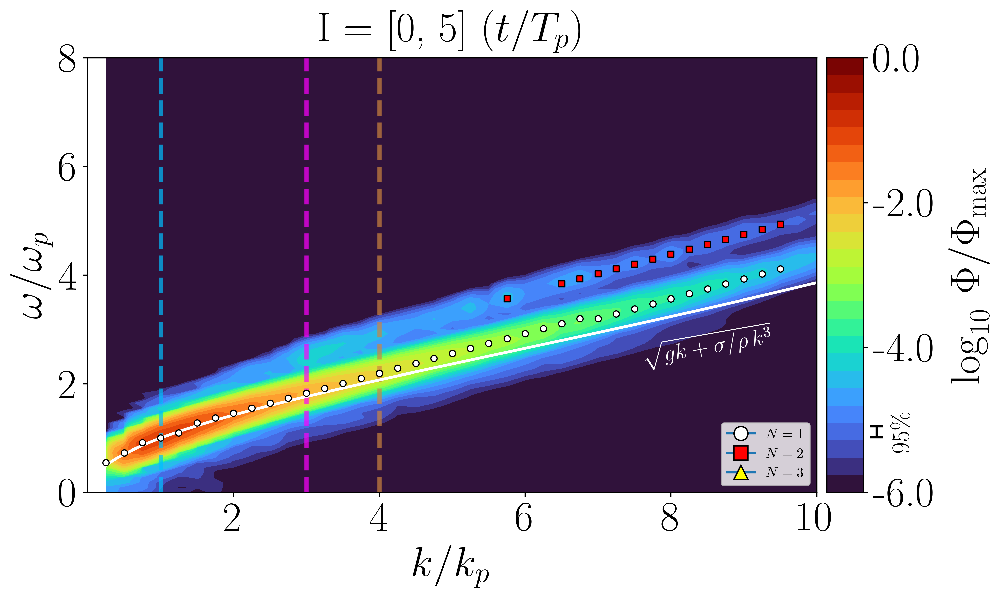

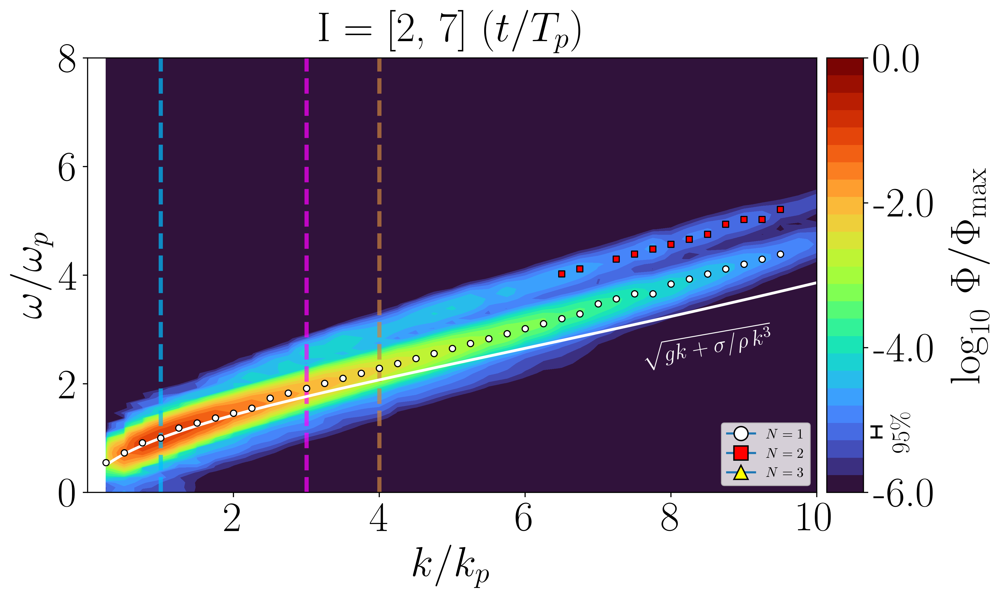

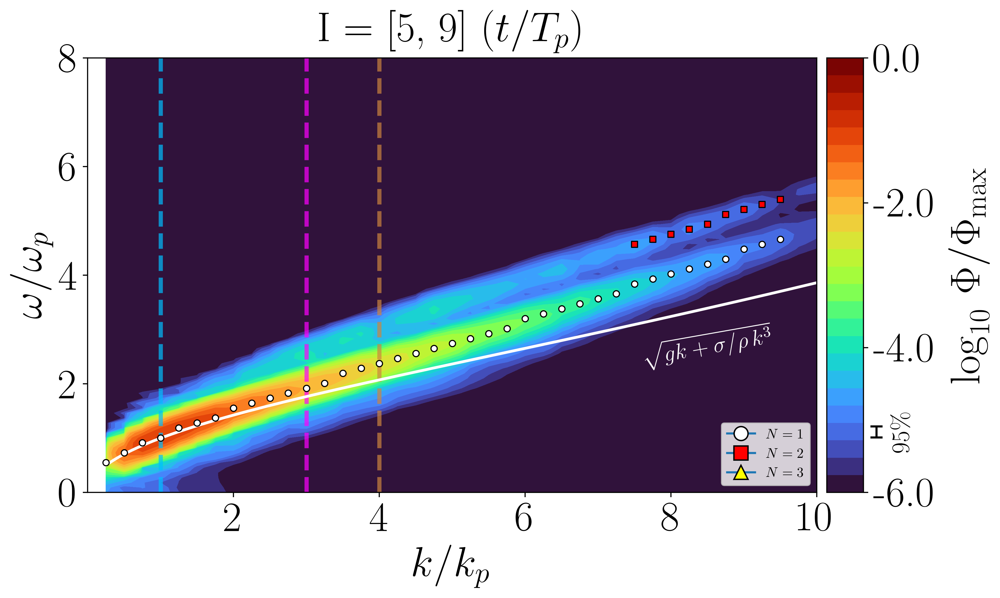

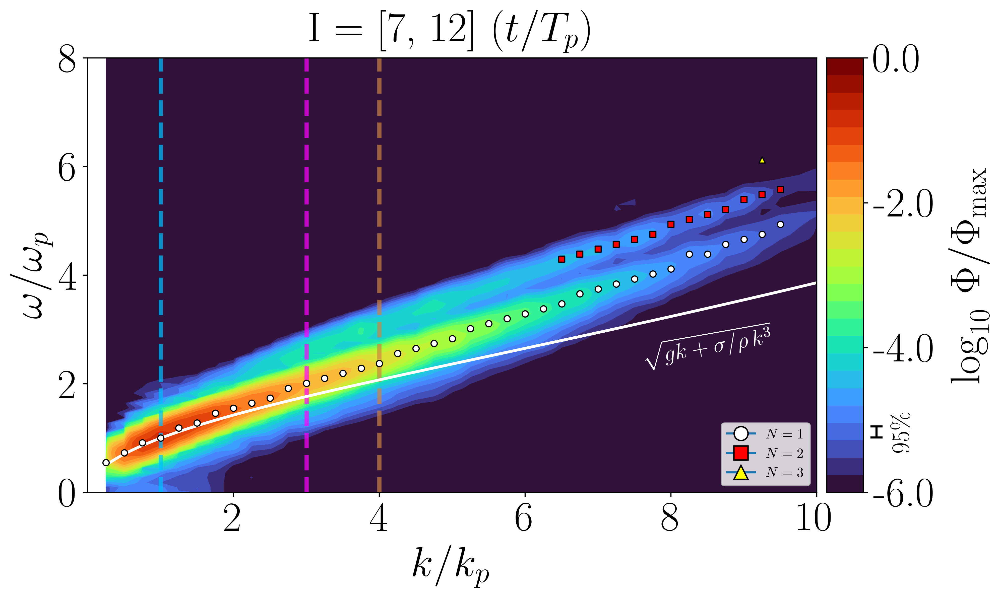

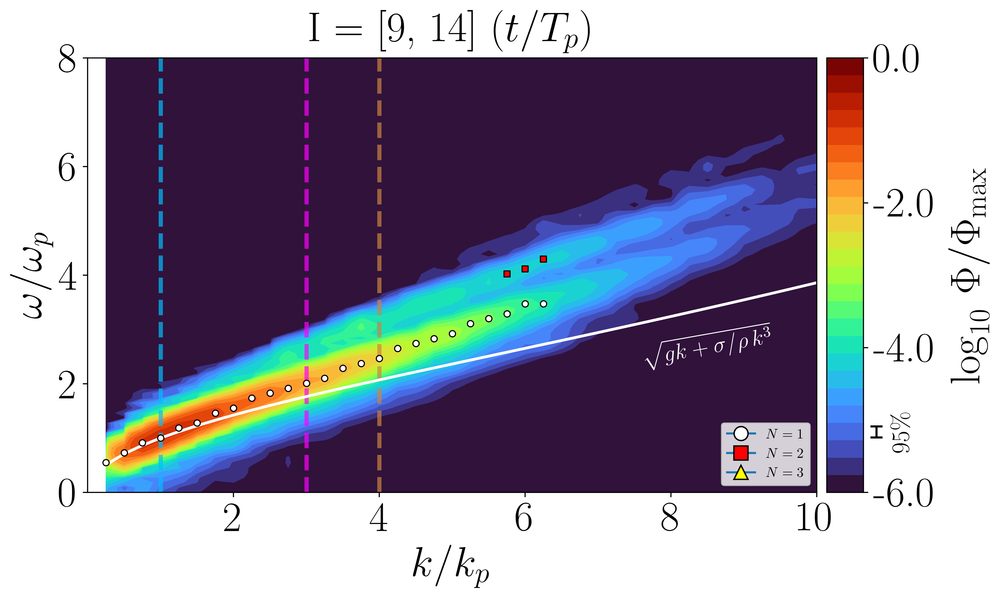

...

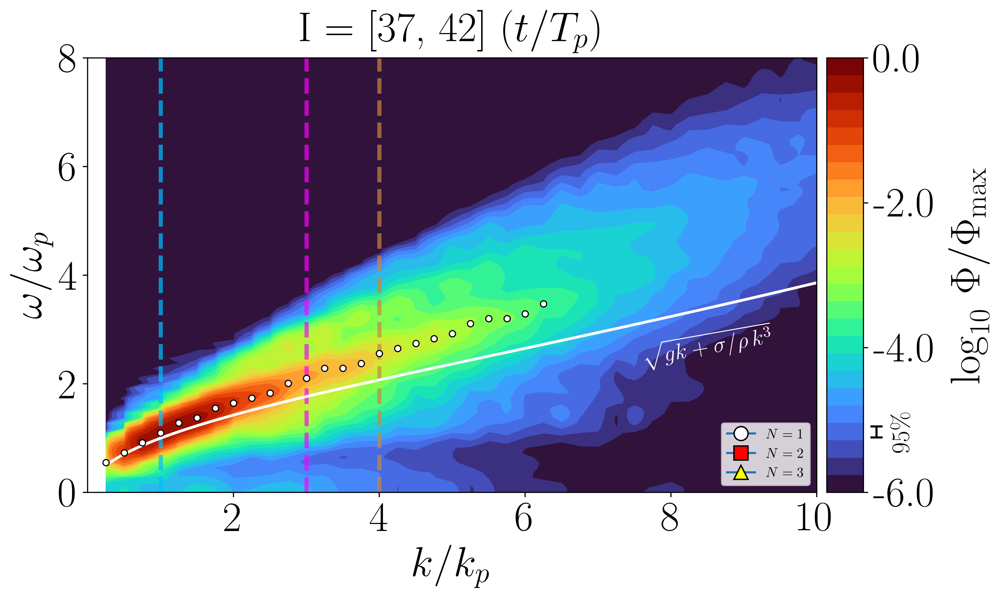

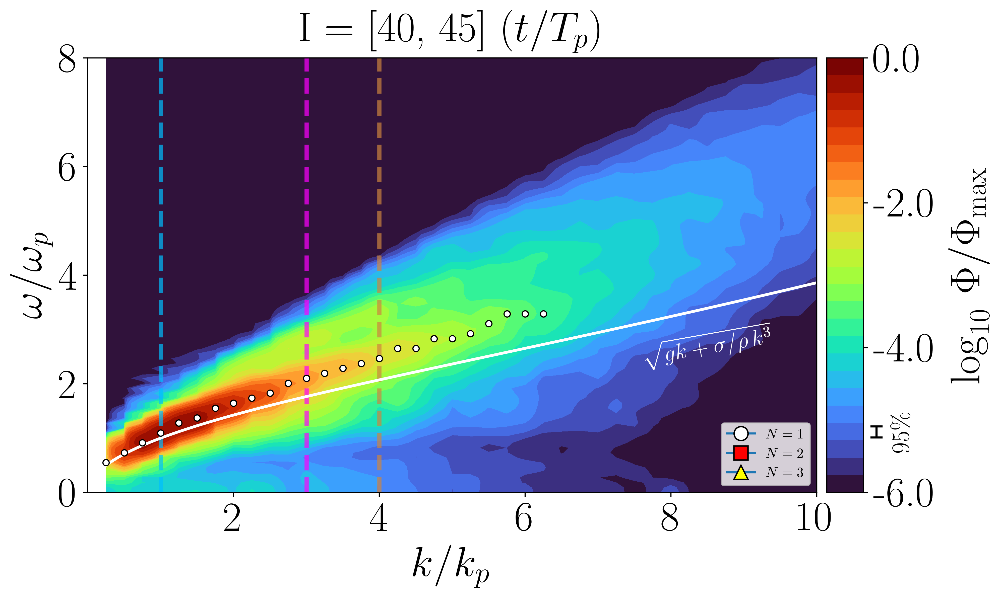

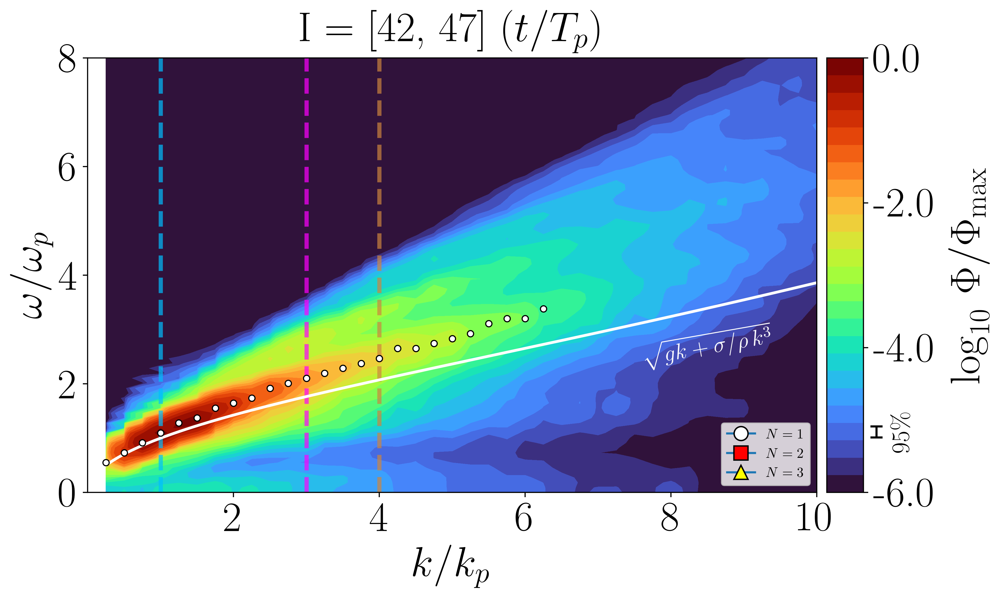

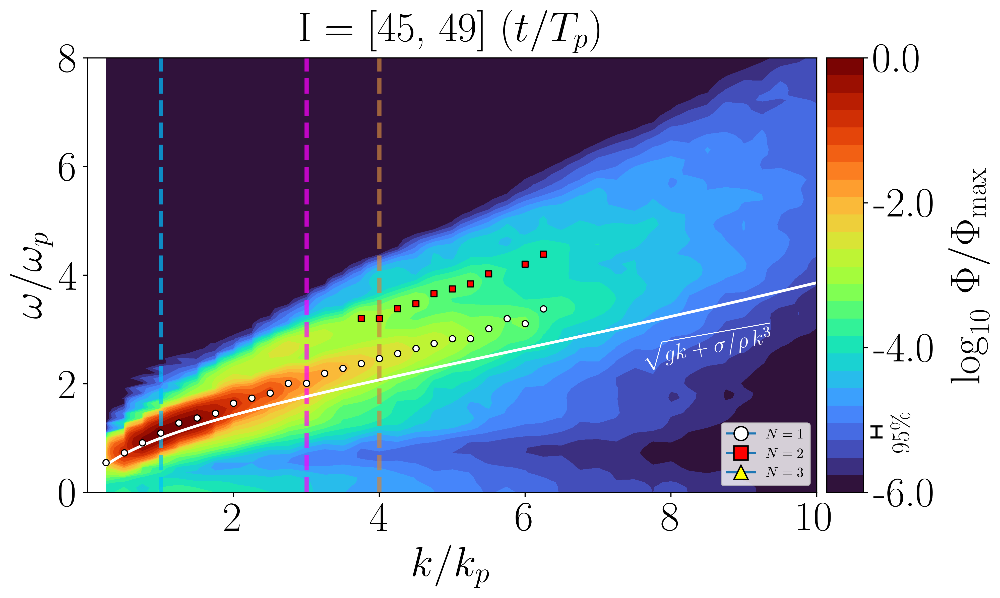

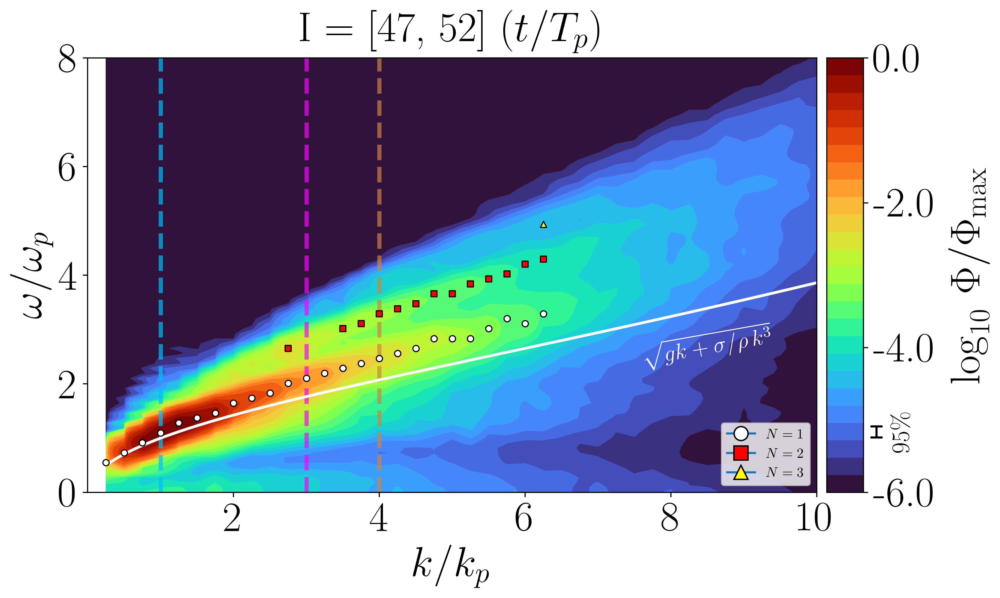

In [21]:
from scipy.signal import find_peaks
from scipy import stats
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Configuración previa (sin cambios) ---
global_max = all_F_komega.max()

vmin, vmax = 1e-6, 1.0
n_levels = 25
levels_norm = np.logspace(np.log10(vmin), 0, n_levels + 1)
cmap = ListedColormap(plt.get_cmap('turbo')(np.linspace(0, 1, n_levels)))
norm = LogNorm(vmin=vmin, vmax=vmax)

log_min, log_max = np.log10(vmin), 0.0
log_ticks = np.linspace(log_min, log_max, 4)
ticks = 10**log_ticks
ticklabels = [f"{lt:.1f}" for lt in log_ticks]

N = len(time); L = ln; step = L // 2
M = int(np.floor((N - L) / step)) + 1
ENBW = 1.5
err_frac = 1.96 * np.sqrt(ENBW / M)
dlog10_CI = np.log10(1 + err_frac)
ci_height = dlog10_CI / (log_max - log_min)

colors = ['white', 'red', 'yellow', 'orange']
markers = ['o', 's', '^', 'd']

max_val = global_max
plt.ioff()

dt = t[1] - t[0]
overlap = int(L * 0.5)

k_min, omega_min = 0, 0
num_intervals = all_F_komega.shape[0]

branches = {k: {'k': [], 'omega': [], 'amp': []}
            for k in ['first','second','third','fourth']}
branch_keys = ['first','second','third','fourth']

k_targets = [4.0, 12.0, 16.0]
k_indices_to_plot = [np.argmin(np.abs(k - val)) for val in k_targets]
color_fixed = ['deepskyblue','magenta','peru']

# Probably this could be automatized but right now one has to close the minimum level of looking for the maxima
#height_interval = [-2.5,-2.5,-2.5,-1.5, -1.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2] #for ak+0.16 u*/c=0.5
#height_interval = [-4,-3,-3,-3, -3,-3.5,-2.5,-2.5,-2.5,-2.5,-2.5,-2.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
#height_interval = [-2,-2,-2.5,-2.5, -2.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
height_interval = [-3.5,-2.5,-1.5,-1.5, -1.5,-1,-1,-1,-1.5,-1.5,-1.5,-1.5,-1.5,-0.5,-0.1,-0.3,-0.5,-0.3,-0.3,-2,-2,-2,-2,-2,-2]#for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-2.5, -2.5,-2,-1,-1] #for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-1.5, -1.5,-3,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]
#height_interval = [-2.5,-2.5,-2.5,-2.5, -2.5,-2.5,-1.5,-1.5,-1.5,-1.5,-1.5,-1.5,-2,-2.5,-2]
#height_interval = [-3.5,-2.5,-1.5,-1.5, -1.5,-1.5,-1.5,-1,-1.5,-1.5,-1.5,-1.5,-1.5,-0.5,-0.1,-0.3,-0.5,-0.3,-0.3,-2,-2,-2,-2,-2,-2]#for ak+0.08 u*/c=0.5
#height_interval = [-2.5,-2.5,-2.5,-2.5, -1,-1.5,-1.5,-1.5,-1.5,-2.5,-1.5,-1.5,-2,-2,-2,-2,-2,-2,-2,-2,-2]

if len(height_interval) < num_intervals:
    raise ValueError("height_interval demasiado corto")

# --- Bucle principal ---
for i in range(num_intervals):
    start = i * step
    if start + L > len(time):
        break

    F_full = np.ma.masked_less_equal(all_F_komega[i], 0)
    k_max_loc = ((9.5 if i < 4 else 6.25) * 4)
    k_idx = np.where((k>=k_min)&(k<=k_max_loc))[0]
    w_idx = np.where((omega>=omega_min)&(omega<=8*omegap))[0]

    sub = np.ma.masked_less_equal(all_F_komega[i][np.ix_(w_idx,k_idx)], 0)
    amps = all_amplitudes_k[i][np.ix_(w_idx,k_idx)]
    kq = k[k_idx]/4; wq = omega[w_idx]/omegap

    fig, ax = plt.subplots(figsize=(10,6))
    cf = ax.contourf(
        k/4, omega/omegap, F_full/max_val,
        levels=levels_norm, cmap=cmap, norm=norm, extend='both'
    )
    for x,c in zip([1,3,4], color_fixed):
        ax.axvline(x, linestyle='--', lw=3, c=c, alpha=0.7)

    # Detección mejorada de picos (hasta 4), con prominence
    for col in range(sub.shape[1]):
        col_data = sub[:, col]
        # Si toda la columna es cero o negativa, la saltamos:
        if col_data.max() <= 0:
            continue
    
        curve = np.log(col_data / col_data.max())
        peaks, props = find_peaks(
            curve,
            height=height_interval[i],
            distance=1,
            prominence=0.1
        )
    
        for j, p in enumerate(peaks[:4]):
            kv = kq[col]
            wv = wq[p]
            av = amps[p, col]
            key = branch_keys[j]
            branches[key]['k'].append(kv)
            branches[key]['omega'].append(wv)
            branches[key]['amp'].append(av)
    
            ax.scatter(
                kv, wv,
                c=colors[j], marker=markers[j],
                s=20, edgecolor='k', linewidth=0.8, zorder=5
            )

    # Dibujar teoría de dispersión
    k_d = np.linspace(0,40,200)
    disp = np.sqrt(k_d*g + ((g-1.25e-3)/(Bo*4**2))/rho1 * k_d**3)/omegap
    ax.plot(k_d/4, disp, '-', lw=2, c='white')
    ax.text(7.6,2.35,
            r'$\sqrt{gk + \sigma/\rho\,k^3}$',
            fontsize=16, rotation=10, color='white')

    # Colorbar discreto
    div = make_axes_locatable(ax)
    cax = div.append_axes('right', size='5%', pad=0.1)
    cb = fig.colorbar(cf, cax=cax,
                      ticks=ticks, boundaries=levels_norm,
                      spacing='proportional', extendfrac=0)
    cb.set_ticklabels(ticklabels)
    cb.set_label(r'$\log_{10}\,\Phi/\Phi_{\max}$', labelpad=10)

    # Barra CI
    x0,y0 = 0.875,0.27
    y1 = y0 + ci_height*0.6
    cap = 0.005
    for yy in (y0,y1):
        fig.lines.append(plt.Line2D([x0-cap,x0+cap],[yy,yy],
                                    transform=fig.transFigure,
                                    color='k',lw=1.5))
    fig.lines.append(plt.Line2D([x0,x0],[y0,y1],
                                transform=fig.transFigure,
                                color='k',lw=1.5,
                                solid_capstyle='butt'))
    fig.text(x0+0.015,(y0+y1)/2,r'$95\%$',
             ha='left',va='center',
             fontsize=18,rotation=90)

    # Leyenda de ramas
    handles = [
        plt.Line2D([0],[0],marker=markers[j],ms=10,
                   markerfacecolor=colors[j],markeredgecolor='k')
        for j in range(3)
    ]
    ax.legend(handles,['$N=1$','$N=2$','$N=3$'],
              loc='lower right',fontsize=10)

    ax.set(xlim=(0,10),ylim=(0,8),
           xticks=[2,4,6,8,10],
           xlabel=r'$k/k_p$',ylabel=r'$\omega/\omega_p$')
    t0 = (time[start]-time[0])*omegap/(2*np.pi)
    t1 = (time[start+L-1]-time[0])*omegap/(2*np.pi)
    ax.set_title(f"I = [{t0:.0f}, {t1:.0f}] $(t/T_p)$", pad=12)

    plt.tight_layout()
    plt.savefig(f"{graph_path}/Ekomega_[{t0:.2f},{t1:.2f}]_disc.pdf",
                dpi=600, bbox_inches='tight')
    plt.show()

#plt.ion()


In [22]:
'''
data = {
    'k_first':    branches['first']['k'],
    'omega_first':branches['first']['omega'],
    'amp_first':  branches['first']['amp'],

    'k_second':    branches['second']['k'],
    'omega_second':branches['second']['omega'],
    'amp_second':  branches['second']['amp'],

    'k_third':     branches['third']['k'],
    'omega_third': branches['third']['omega'],
    'amp_third':   branches['third']['amp'],

    'k_fourth':    branches['fourth']['k'],
    'omega_fourth':branches['fourth']['omega'],
    'amp_fourth':  branches['fourth']['amp'],
}

# Convertimos a DataFrame. 
# Obs.: pandas rellenará con NaN donde las listas tengan distinto largo.
df_branches = pd.DataFrame.from_dict(data, orient='columns')

# Guardamos a CSV
outfile = (
    f'/projects/DEIKE/cmartinb/branches_data/'
    f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv'
)
df_branches.to_csv(outfile, index=False)

# Opcional: ver en pantalla las primeras filas
print(df_branches.head())
'''

"\ndata = {\n    'k_first':    branches['first']['k'],\n    'omega_first':branches['first']['omega'],\n    'amp_first':  branches['first']['amp'],\n\n    'k_second':    branches['second']['k'],\n    'omega_second':branches['second']['omega'],\n    'amp_second':  branches['second']['amp'],\n\n    'k_third':     branches['third']['k'],\n    'omega_third': branches['third']['omega'],\n    'amp_third':   branches['third']['amp'],\n\n    'k_fourth':    branches['fourth']['k'],\n    'omega_fourth':branches['fourth']['omega'],\n    'amp_fourth':  branches['fourth']['amp'],\n}\n\n# Convertimos a DataFrame. \n# Obs.: pandas rellenará con NaN donde las listas tengan distinto largo.\ndf_branches = pd.DataFrame.from_dict(data, orient='columns')\n\n# Guardamos a CSV\noutfile = (\n    f'/projects/DEIKE/cmartinb/branches_data/'\n    f'branches_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv'\n)\ndf_branches.to_csv(outfile, index=False)\n\n# Opcional: ver en pantalla las primeras filas\nprin

In [23]:
'''
normalization_factors = [np.sqrt(1), np.sqrt(1), np.sqrt(1),np.sqrt(1) ]

interval_indices_first = np.array(interval_indices_first, dtype=int)
interval_indices_second = np.array(interval_indices_second, dtype=int)
interval_indices_third = np.array(interval_indices_third, dtype=int)
interval_indices_fourth = np.array(interval_indices_fourth, dtype=int)

normalized_omega_first = np.abs(np.array(omega_values_first)) / normalization_factors[0]
normalized_omega_second = np.abs(np.array(omega_values_second)) / normalization_factors[1]
normalized_omega_third = np.abs(np.array(omega_values_third)) / normalization_factors[2]
normalized_omega_fourth = np.abs(np.array(omega_values_fourth)) / normalization_factors[3]

normalized_differences_first = np.abs(np.array(differences_first)) / normalization_factors[0]
normalized_differences_second = np.abs(np.array(differences_second)) / normalization_factors[1]
normalized_differences_third = np.abs(np.array(differences_third)) / normalization_factors[2]
normalized_differences_fourth = np.abs(np.array(differences_fourth)) / normalization_factors[3]

amplitude_values_first = np.abs(np.array(amplitude_values_first, dtype=int))
amplitude_values_second = np.abs(np.array(amplitude_values_second, dtype=int))
amplitude_values_third = np.abs(np.array(amplitude_values_third, dtype=int))
'''

'\nnormalization_factors = [np.sqrt(1), np.sqrt(1), np.sqrt(1),np.sqrt(1) ]\n\ninterval_indices_first = np.array(interval_indices_first, dtype=int)\ninterval_indices_second = np.array(interval_indices_second, dtype=int)\ninterval_indices_third = np.array(interval_indices_third, dtype=int)\ninterval_indices_fourth = np.array(interval_indices_fourth, dtype=int)\n\nnormalized_omega_first = np.abs(np.array(omega_values_first)) / normalization_factors[0]\nnormalized_omega_second = np.abs(np.array(omega_values_second)) / normalization_factors[1]\nnormalized_omega_third = np.abs(np.array(omega_values_third)) / normalization_factors[2]\nnormalized_omega_fourth = np.abs(np.array(omega_values_fourth)) / normalization_factors[3]\n\nnormalized_differences_first = np.abs(np.array(differences_first)) / normalization_factors[0]\nnormalized_differences_second = np.abs(np.array(differences_second)) / normalization_factors[1]\nnormalized_differences_third = np.abs(np.array(differences_third)) / normaliz

## Graphs cuts spectra at fixed k

/tmp/ipykernel_3511715/3210838925.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # deja espacio para colorbars


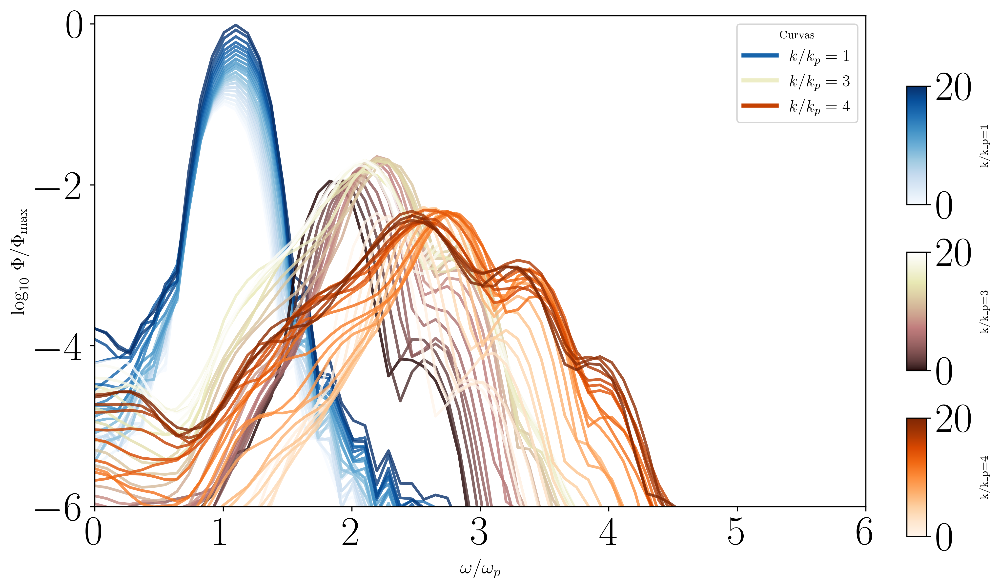

In [24]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks

max_val = np.max(all_F_komega)

# Colormaps para cada k fijo
cmaps = {
    0: plt.cm.Blues,            # k/kp = 1 → azules
    1: plt.get_cmap('pink'),    # k/kp = 3 → rosas
    2: plt.cm.Oranges           # k/kp = 4 → naranjas
}
norm_time = mpl.colors.Normalize(vmin=0, vmax=num_intervals-1)

fig, ax = plt.subplots(figsize=(10, 6))

for j, k_idx in enumerate(k_indices_to_plot):
    cmap_j = cmaps[j]
    label = f"$k/k_p = {k_targets[j]/4:.0f}$"
    
    # Dibujamos todos los intervalos superpuestos
    for i in range(num_intervals):
        curve = np.log10(all_F_komega[i, :, k_idx] / max_val)
        color = cmap_j(norm_time(i))
        ax.plot(
            omega/omegap,
            curve,
            color=color,
            linewidth=2,
            alpha=0.8
        )
    
    # Línea dummy para la leyenda
    ax.plot([], [], color=cmap_j(0.8), lw=3, label=label)

# Etiquetas y título
ax.set_xlabel(r'$\omega/\omega_p$', fontsize=14)
ax.set_ylabel(r'$\log_{10}\,\Phi/\Phi_{\max}$', fontsize=14)
ax.set_xlim(0, 6)
ax.set_ylim(-6, 0.1)
ax.legend(loc='upper right', fontsize=12, title="Curvas")

# Dibujar 3 colorbars pequeñas
for j in range(3):
    left = 0.92
    bottom = 0.65 - j * 0.28
    width, height = 0.02, 0.2
    cax = fig.add_axes([left, bottom, width, height])
    cb = mpl.colorbar.ColorbarBase(
        cax,
        cmap=cmaps[j],
        norm=norm_time,
        orientation='vertical',
        ticks=[0, num_intervals-1]
    )
    cb.set_label(f"k/k_p={k_targets[j]/4:.0f}", fontsize=8)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # deja espacio para colorbars
plt.savefig(f"{graph_path}/E_kfixed_superposed.pdf", dpi=300)
plt.show()


/tmp/ipykernel_3511715/931423768.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


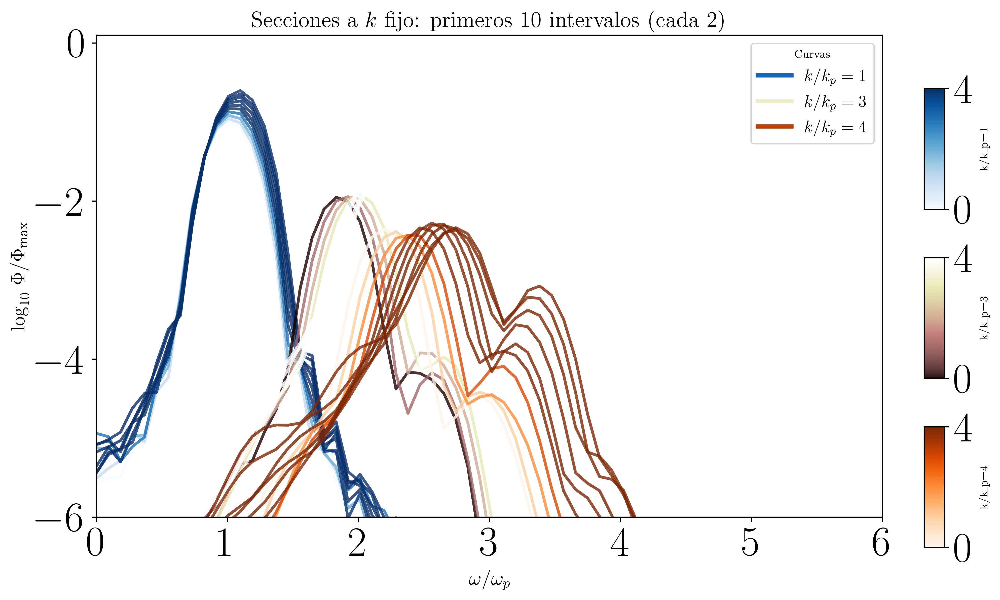

In [25]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks

# --- Variables ya definidas: ---
# all_F_komega, omega, omegap, k_targets, k_indices_to_plot,
# num_intervals, ln, overlap, time, graph_path

max_val = np.max(all_F_komega)

# Colormaps para cada k fijo
cmaps = {
    0: plt.cm.Blues,            # k/kp = 1 → azules
    1: plt.get_cmap('pink'),    # k/kp = 3 → rosas
    2: plt.cm.Oranges           # k/kp = 4 → naranjas
}
norm_time = mpl.colors.Normalize(vmin=0, vmax=(num_intervals//2 - 1)//2)

fig, ax = plt.subplots(figsize=(10, 6))

# Solo hasta la mitad de los intervalos, cada 2
max_i = num_intervals // 2
for j, k_idx in enumerate(k_indices_to_plot):
    cmap_j = cmaps[j]
    label = f"$k/k_p = {k_targets[j]/4:.0f}$"
    
    for count, i in enumerate(range(0, max_i)):
        curve = np.log10(all_F_komega[i, :, k_idx] / max_val)
        color = cmap_j(norm_time(count))
        ax.plot(
            omega/omegap,
            curve,
            color=color,
            linewidth=2,
            alpha=0.8
        )
    
    # Dummy line para la leyenda
    ax.plot([], [], color=cmap_j(0.8), lw=3, label=label)

# Etiquetas y título
ax.set_xlabel(r'$\omega/\omega_p$', fontsize=14)
ax.set_ylabel(r'$\log_{10}\,\Phi/\Phi_{\max}$', fontsize=14)
ax.set_title(
    "Secciones a $k$ fijo: primeros " 
    f"{max_i} intervalos (cada 2)",
    fontsize=16
)
ax.set_xlim(0, 6)
ax.set_ylim(-6, 0.1)
ax.legend(loc='upper right', fontsize=12, title="Curvas")

# Dibujar las 3 colorbars
for j in range(3):
    left = 0.92
    bottom = 0.65 - j * 0.28
    width, height = 0.02, 0.2
    cax = fig.add_axes([left, bottom, width, height])
    cb = mpl.colorbar.ColorbarBase(
        cax,
        cmap=cmaps[j],
        norm=norm_time,
        orientation='vertical',
        ticks=[0, norm_time.vmax]
    )
    cb.set_label(f"k/k_p={k_targets[j]/4:.0f}", fontsize=8)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.savefig(f"{graph_path}/E_kfixed_halfstep2_superposed.pdf", dpi=300)
plt.show()


/tmp/ipykernel_3511715/2357471130.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


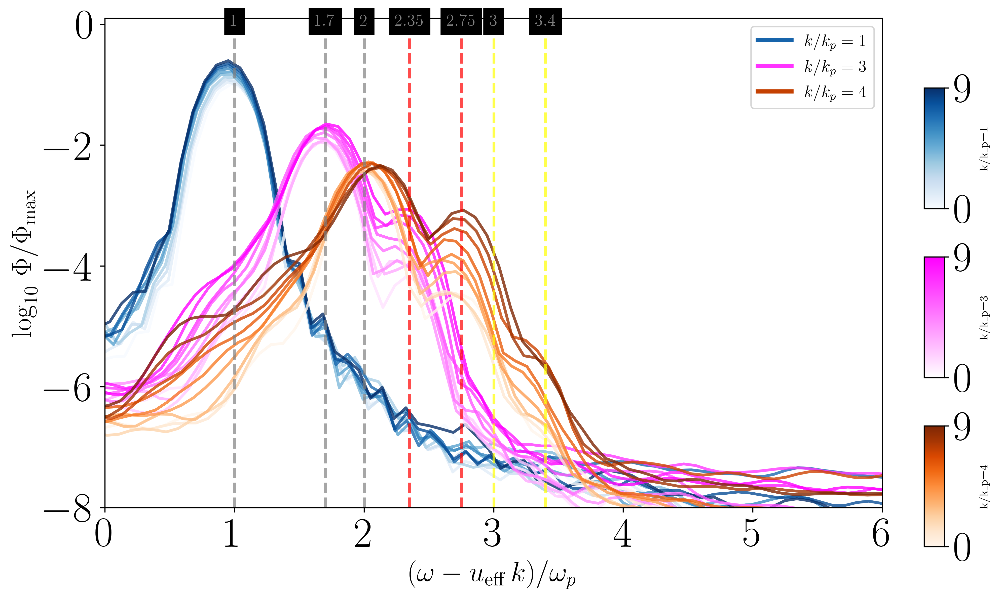

In [26]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks

# --- Asumimos definidas estas variables: ---
# all_F_komega, omega, omegap, k, k_targets, k_indices_to_plot,
# num_intervals, ln, overlap, time,
# prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10, graph_path

max_val = np.max(all_F_komega)

# Construimos un colormap magenta→blanco para reemplazar 'pink'
magenta_cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'magenta_cmap', ['#ffffff', '#ff00ff']
)

# Colormaps para cada k fijo
cmaps = {
    0: plt.cm.Blues,      # k/kp = 1 → azules
    1: magenta_cmap,      # k/kp = 3 → magenta
    2: plt.cm.Oranges     # k/kp = 4 → naranjas
}
# Normalización del índice de intervalo
norm_time = mpl.colors.Normalize(vmin=0, vmax=num_intervals//2 - 1)

# Tomamos la mitad de los intervalos, paso 1 (o ajusta a tu gusto)
indices = list(range(0, num_intervals//2))

fig, ax = plt.subplots(figsize=(10,6))

for j, k_idx in enumerate(k_indices_to_plot):
    cmap_j = cmaps[j]
    kt = k[k_idx]
    label = f"$k/k_p={k_targets[j]/4:.0f}$"

    for count, i in enumerate(indices):
        # Cálculo de u_i por la integral
        ux = prof_L10_wat_wfc[i_v_d_L10[i], :]
        phi = zgrid_L10_wfc[i_v_d_L10[i], :] - 1
        integrand = ux * np.exp(2 * kt * 4 * phi)
        doppler_speed = 4 * kt * np.trapz(integrand, phi)
        u_i = 2 * doppler_speed * kt

        # Espectro normalizado y logaritmo
        E = np.log10(all_F_komega[i, :, k_idx] / max_val)

        # Eje x desplazado: (ω - u_i)/ω_p
        x = (omega - u_i) / omegap

        # Dibujamos la curva con degradado de magenta
        color = cmap_j(norm_time(count))
        ax.plot(x, E, color=color, lw=2, alpha=0.8)

    # Línea dummy para la leyenda
    ax.plot([], [], color=cmap_j(0.8), lw=3, label=label)

positions = [1, 1.7,2, 2.35, 2.75, 3, 3.4]
line_colors = [
    'grey', 'grey', 'grey',  # 1, 1.35, 1.7 en azul gris
    'red', 'red',                          # 2, 2.35 en rojo
    'yellow','yellow'                                # 3 en amarillo
]

for x0, col in zip(positions, line_colors):
    ax.axvline(
        x=x0,
        color=col,
        linestyle='--',
        linewidth=2,
        alpha=0.7
    )
    ax.text(
        x0, ax.get_ylim()[1],
        f"{x0}",
        color='white',
        ha='center',
        va='bottom',
        fontsize=12,
        backgroundcolor='black',
        alpha=0.5
    )


# Etiquetas y título
ax.set_xlabel(r'$(\omega - u_{\mathrm{eff}}\,k)/\omega_p$', fontsize=20)
ax.set_ylabel(r'$\log_{10}\,\Phi/\Phi_{\max}$', fontsize=20)
ax.set_xlim(0, 6)
ax.set_ylim(-8, 0.1)
ax.legend(loc='upper right', fontsize=12)

# Tres mini‐colorbars para el tiempo, una por colormap
for j in range(3):
    left = 0.92
    bottom = 0.65 - j*0.28
    cax = fig.add_axes([left, bottom, 0.02, 0.2])
    cb = mpl.colorbar.ColorbarBase(
        cax, cmap=cmaps[j],
        norm=norm_time, orientation='vertical',
        ticks=[0, len(indices)-1]
    )
    cb.set_label(f"k/k_p={k_targets[j]/4:.0f}", fontsize=8)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.savefig(f"{graph_path}/E_kfixed_doppler_shifted_magenta.pdf", dpi=300)
plt.show()



/tmp/ipykernel_3511715/667922028.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0.9,1])


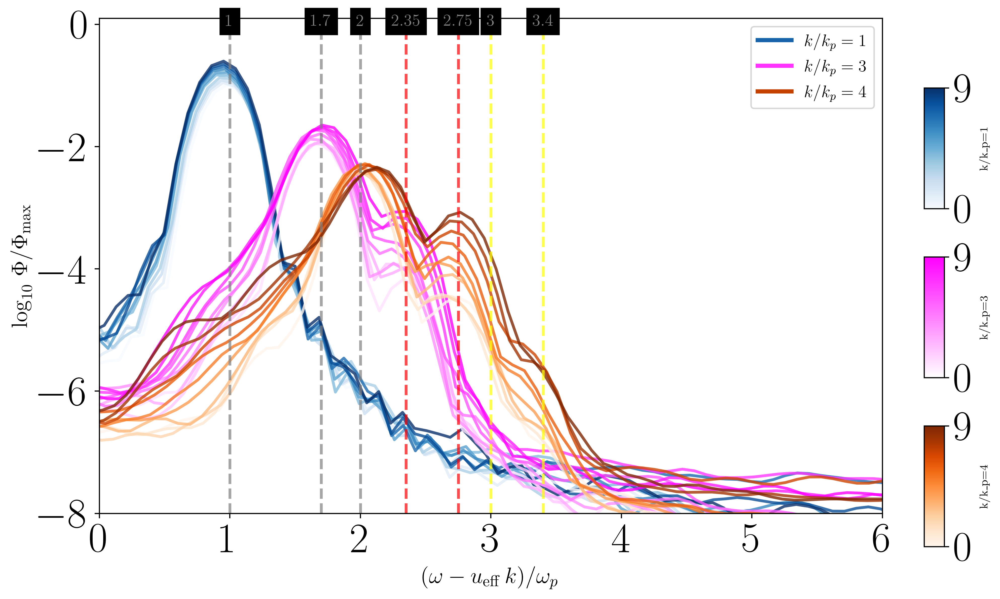

In [27]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks

# --- Variables definidas previamente ---
# all_F_komega, omega, omegap, k, k_targets, k_indices_to_plot,
# num_intervals, ln, overlap, time,
# prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10, graph_path

max_val = np.max(all_F_komega)

# Colormaps para cada k fijo
magenta_cmap = mpl.colors.LinearSegmentedColormap.from_list('magenta_cmap',['#ffffff','#ff00ff'])
cmaps = {0: plt.cm.Blues, 1: magenta_cmap, 2: plt.cm.Oranges}
norm_time = mpl.colors.Normalize(vmin=0, vmax=num_intervals//2-1)

# Los intervalos que vamos a usar (primera mitad)
indices = list(range(0, num_intervals//2))

# Preparamos un vector de tiempos medios t/Tp
times = []
for i in indices:
    start = i*(ln-overlap)
    t_mid = 0.5*(time[start] + time[start+ln-1])
    times.append((t_mid-time[0])*omegap/(2*np.pi))
times = np.array(times)

# Las posiciones de interés en (ω-u k)/ω_p
positions = [1, 1.7, 2, 2.35, 2.75, 3, 3.4]
line_colors = ['grey','grey','grey','red','red','yellow','yellow']

# Diccionario donde guardaremos la evolución de cada par (j,pos)
# historial[(j,pos)] = list de amplitudes
historial = {}

fig, ax = plt.subplots(figsize=(10,6))

for j, k_idx in enumerate(k_indices_to_plot):
    cmap_j = cmaps[j]
    kt = k[k_idx]
    label = f"$k/k_p={k_targets[j]/4:.0f}$"

    # inicializamos listas vacías para cada posición
    for pos in positions:
        historial[(j,pos)] = []

    for count, i in enumerate(indices):
        # 1) calculamos el shift u_i
        ux = prof_L10_wat_wfc[i_v_d_L10[i], :]
        phi = zgrid_L10_wfc[i_v_d_L10[i], :] - 1
        integrand = ux * np.exp(2*kt*4*phi)
        doppler_speed = 4*kt*np.trapz(integrand, phi)
        u_i = 2*doppler_speed*kt

        # 2) espectro normalizado
        E = np.log10(all_F_komega[i, :, k_idx] / max_val)
        x = (omega - u_i)/omegap

        # ploteo de la curva
        color = cmap_j(norm_time(count))
        ax.plot(x, E, color=color, lw=2, alpha=0.8)

        # 3) para cada posición guardamos la amplitud más cercana
        for pos in positions:
            idx = np.argmin(np.abs(x-pos))
            historial[(j,pos)].append(E[idx])

    # dummy para leyenda
    ax.plot([], [], color=cmap_j(0.8), lw=3, label=label)

# trazamos las líneas verticales
for x0, col in zip(positions, line_colors):
    ax.axvline(x=x0, color=col, linestyle='--', linewidth=2, alpha=0.7)
    ax.text(x0, ax.get_ylim()[1],f"{x0}",color='white',
            ha='center',va='bottom',fontsize=12,
            backgroundcolor='black',alpha=0.5)

ax.set_xlabel(r'$(\omega - u_{\mathrm{eff}}\,k)/\omega_p$',fontsize=16)
ax.set_ylabel(r'$\log_{10}\,\Phi/\Phi_{\max}$',fontsize=16)
ax.set_xlim(0,6); ax.set_ylim(-8,0.1)
ax.legend(loc='upper right',fontsize=12)

# mini colorbars
for j in range(3):
    cax = fig.add_axes([0.92,0.65-j*0.28,0.02,0.2])
    cb = mpl.colorbar.ColorbarBase(cax,cmap=cmaps[j],
        norm=norm_time,orientation='vertical',
        ticks=[0,len(indices)-1])
    cb.set_label(f"k/k_p={k_targets[j]/4:.0f}",fontsize=8)

plt.tight_layout(rect=[0,0,0.9,1])
#plt.savefig(f"{graph_path}/E_kfixed_doppler_historial.pdf",dpi=300)
plt.show()


<>:37: SyntaxWarning: invalid escape sequence '\;'
<>:37: SyntaxWarning: invalid escape sequence '\;'
/tmp/ipykernel_3511715/1150850843.py:37: SyntaxWarning: invalid escape sequence '\;'
  label=f"$k/k_p={k_targets[j]/4:.0f},\;\omega/\omega_p={pos}$"


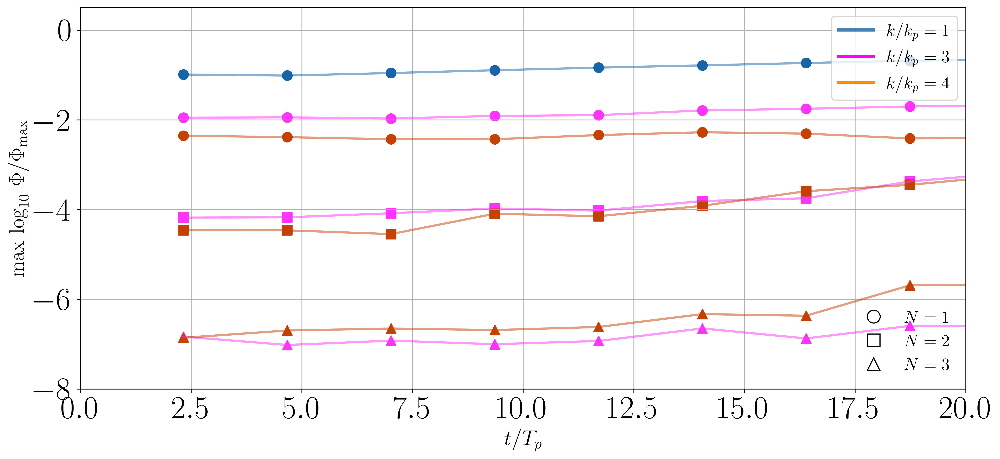

In [28]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# (Suponemos que ya tienes definidas todas las variables previas)
plot_positions = {
    0: [1.0],           # j=0 (k/kp=1) → ω/ωp = 1
    1: [1.7, 2.35, 3.0],# j=1 (k/kp=3) → ω/ωp = 1.7, 2.35, 3
    2: [2.0, 2.75, 3.4] # j=2 (k/kp=4) → ω/ωp = 2, 2.75, 3.4
}
# Marcadores según posición
marker_map = {
    1.0: 'o', 1.7: 'o', 2.0: 'o',   # círculos
    2.35: 's', 2.75: 's',           # cuadrados
    3.0: '^', 3.4: '^'              # triángulos
}

fig, ax = plt.subplots(figsize=(13,6))
k_colors = {j: cmaps[j%3](0.8) for j in range(len(k_indices))}  
# 1) Dibujamos todas las series y guardamos sus handles/labels
for j, k_idx in enumerate(k_indices_to_plot):
    color = k_colors[j]
    for pos in plot_positions[j]:
        amps = np.array(historial[(j, pos)])
        line, = ax.plot(
            times, amps,
            color=color,
            linewidth=2,
            alpha=0.5
        )
        pts = ax.scatter(
            times, amps,
            color=color,
            marker=marker_map[pos],
            s=80,
            label=f"$k/k_p={k_targets[j]/4:.0f},\;\omega/\omega_p={pos}$"
        )

# Etiquetas y límites
ax.set_xlabel(r"$t/T_p$", fontsize=20)
ax.set_ylabel(r"$\max\,\log_{10}\,\Phi/\Phi_{\max}$", fontsize=20)
ax.set_xlim(0, 20)
ax.set_ylim(-8, 0.5)
ax.grid(True)

# 1) Leyenda de colores para k/kp
legend_lines = [
    Line2D([0], [0], color='steelblue', lw=3),
    Line2D([0], [0], color='#ff00ff', lw=3),
    Line2D([0], [0], color='darkorange', lw=3),
]
legend_labels = [
    r"$k/k_p = 1$",
    r"$k/k_p = 3$",
    r"$k/k_p = 4$",
]
leg1 = ax.legend(
    legend_lines, legend_labels,
    loc='upper right',
    fontsize=16
)
ax.add_artist(leg1)

# 2) Leyenda de ramas N con símbolos vacíos
legend_markers = ['o', 's', '^']
legend_labels_N = ['$N=1$', '$N=2$', '$N=3$']
handles_N = [
    Line2D(
        [0], [0],
        marker=legend_markers[i],
        color='k',
        markerfacecolor='none',
        markeredgecolor='k',
        markersize=12,
        linestyle='None'
    )
    for i in range(3)
]
ax.legend(
    handles_N,
    legend_labels_N,
    loc='lower right',
    fontsize=16,
    frameon=False
)

plt.tight_layout()
plt.show()


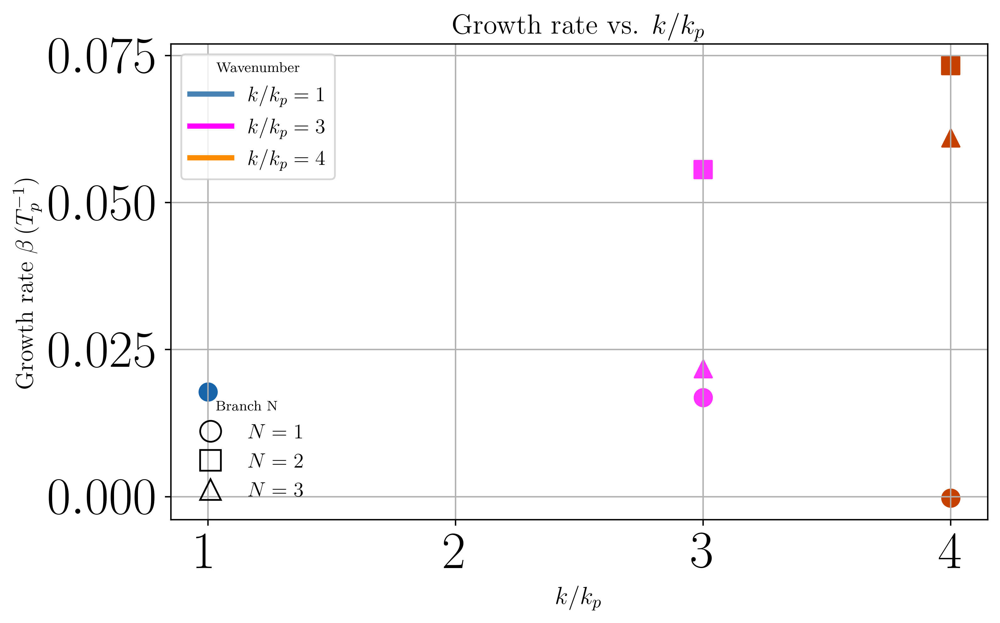

In [29]:
from scipy.stats import linregress
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# 1) Calculamos todas las pendientes β para cada (j,pos)
slopes = {}
for j, k_idx in enumerate(k_indices_to_plot):
    k_val = k_targets[j]/4
    for pos in plot_positions[j]:
        A = np.array(historial[(j,pos)])  # evolución de amplitud
        # Ajuste lineal: A = β·t + C
        slope, intercept, r, p, std = linregress(times, A)
        slopes[(j,pos)] = slope

# 2) Dibujamos β vs k/kp
fig, ax = plt.subplots(figsize=(8,5))
for j, k_idx in enumerate(k_indices_to_plot):
    k_val = k_targets[j]/4
    for pos in plot_positions[j]:
        β = slopes[(j,pos)]
        ax.scatter(
            k_val, β,
            color=k_colors[j],
            marker=marker_map[pos],
            s=100,
            label=f"$k/k_p={k_val:.0f},\\,\\omega/\\omega_p={pos}$"
        )

ax.set_xlabel(r"$k/k_p$", fontsize=14)
ax.set_ylabel(r"Growth rate $\beta\,(T_p^{-1})$", fontsize=14)
ax.set_title("Growth rate vs. $k/k_p$", fontsize=16)
ax.grid(True)

# 3) Leyenda de colores (k/kp)
legend_lines = [
    Line2D([0],[0], color='steelblue', lw=3),
    Line2D([0],[0], color='#ff00ff', lw=3),
    Line2D([0],[0], color='darkorange', lw=3)
]
legend_labels = [r"$k/k_p=1$", r"$k/k_p=3$", r"$k/k_p=4$"]
leg1 = ax.legend(
    legend_lines, legend_labels,
    loc='upper left', title="Wavenumber",
    fontsize=12
)
ax.add_artist(leg1)

# 4) Leyenda de marcadores vacíos (rama N)
legend_markers = ['o','s','^']
legend_labels_N = ['$N=1$', '$N=2$', '$N=3$']
handles_N = [
    Line2D([0],[0],
           marker=legend_markers[i],
           color='k',
           markerfacecolor='none',
           markeredgecolor='k',
           markersize=12,
           linestyle='None')
    for i in range(3)
]
ax.legend(
    handles_N, legend_labels_N,
    loc='lower left', title="Branch N",
    fontsize=12, frameon=False
)

plt.tight_layout()
plt.show()


In [30]:
def compute_historial(
    all_F_komega, omega, omegap,
    prof, phi_grid, i_v_d,
    k_targets, k_indices,
    num_intervals, ln, overlap, time,
    positions, max_frac=0.5
):
    """
    Para cada k fijo y cada posición de interés,
    devuelve un dict historial[(j,pos)] = [E1, E2, ...] 
    donde Ej = max log10 Phi en ese intervalo.
    """
    max_val = all_F_komega.max()
    indices = list(range(int(num_intervals*max_frac)))
    
    # tiempos medios
    times = []
    for i in indices:
        s = i*(ln-overlap)
        t_mid = 0.5*(time[s] + time[s+ln-1])
        times.append((t_mid-time[0])*omegap/(2*np.pi))
    times = np.array(times)

    historial = { (j,pos): [] for j in range(len(k_indices)) for pos in positions }

    for j, k_idx in enumerate(k_indices):
        kt = k_targets[j]
        for i in indices:
            # doppler
            ux = prof[i_v_d[i],:]
            phi= phi_grid[i_v_d[i],:]-1
            integrand = ux*np.exp(2*kt*4*phi)
            doppler = 4*kt*np.trapz(integrand,phi)
            u_i = 2*doppler*kt

            E = np.log10(all_F_komega[i,:,k_idx]/max_val)
            x = (omega - u_i)/omegap

            for pos in positions:
                # máxima en ventana ±delta
                delta = 0.2
                mask = np.abs(x-pos)<delta
                historial[(j,pos)].append(E[mask].max() if mask.any() else np.nan)

    return times, historial


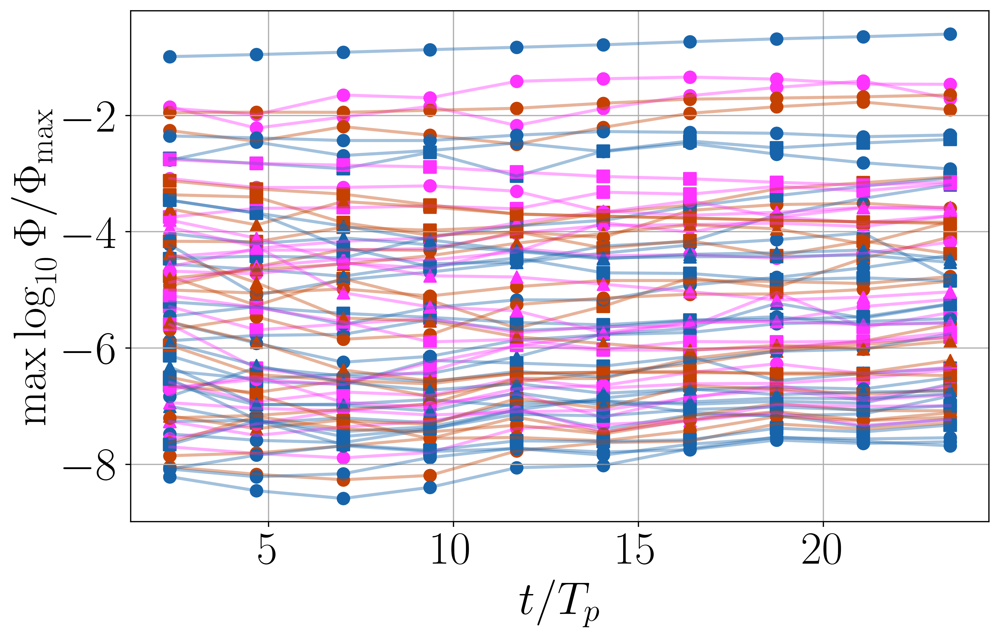

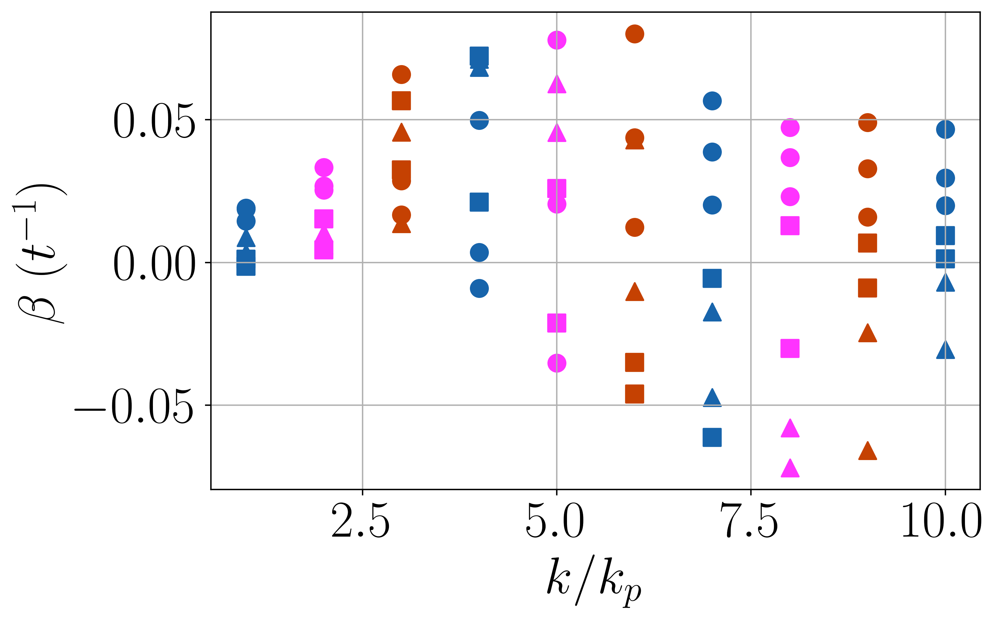

In [31]:
import numpy as np
from scipy.signal import find_peaks
from scipy.stats    import linregress
import matplotlib.pyplot as plt

# 1) Elegimos el primer intervalo a usar (por ejemplo i=0)
i0 = 0
# y construimos u₀, E₀, x₀ tal como en el bucle:
hist = {}
peak_positions = {}

for j, k_idx in enumerate(k_indices_to_plot):
    # calculamos u₀
    kt = k[k_idx]
    ux0 = prof_L10_wat_wfc[i_v_d_L10[i0], :]
    phi0= zgrid_L10_wfc[i_v_d_L10[i0], :] - 1
    integrand0 = ux0 * np.exp(2 * kt * 4 * phi0)
    dop0 = 4 * kt * np.trapz(integrand0, phi0)
    u0   = 2 * dop0 * kt

    # espectro inicial
    E0 = np.log10(all_F_komega[i0, :, k_idx] / max_val)
    x0 = (omega - u0) / omegap

    # detectamos los picos
    peaks0, props0 = find_peaks(
        E0,
        distance=3,        # separa al menos 3 bins
        prominence=0.3     # descarta brotecillos
    )
    # ordenamos por amplitud descendente
    order0 = peaks0[np.argsort(E0[peaks0])[::-1]]
    # tomamos los primeros 3 (o N que quieras)
    N = 3
    sel = order0[:N]
    pos = x0[sel]
    peak_positions[j] = pos.tolist()

# ahora peak_positions es un dict { j : [pos1,pos2,pos3] }

# 2) Adaptamos compute_historial para tomar posiciones por k:
def compute_historial_auto(
    all_F, omega, omegap, prof, phi_grid, ivd,
    k_targets, k_indices, times, positions_dict
):
    historial = {}
    for j, k_idx in enumerate(k_indices):
        kt = k_targets[j]
        for pos in positions_dict[j]:
            historial[(j,pos)] = []

    for ti, i in enumerate(indices):
        for j, k_idx in enumerate(k_indices):
            kt = k_targets[j]
            ux = prof[ivd[i], :]
            phi= phi_grid[ivd[i], :] - 1
            dop = 4*kt*np.trapz(ux*np.exp(2*kt*4*phi), phi)
            u_i= 2*dop*kt

            E = np.log10(all_F[ i, :, k_idx ] / max_val)
            x = (omega - u_i)/omegap
            for pos in positions_dict[j]:
                idx = np.argmin(np.abs(x - pos))
                historial[(j,pos)].append(E[idx])
    return historial

historial = compute_historial_auto(
    all_F_komega, omega, omegap,
    prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10,
    k_targets, k_indices_to_plot,
    times, peak_positions
)


def plot_spectra_and_hist(
    times, historial, k_targets, k_indices,
    k_colors, marker_map, positions
):
    fig, ax = plt.subplots(figsize=(10,6))
    # líneas + punto por cada (j,pos)
    for j in range(len(k_indices)):
        color = k_colors[j]
        for pos in positions:
            amps = np.array(historial[(j,pos)])
            ax.plot(times, amps, color=color, alpha=0.4, lw=2)
            ax.scatter(times, amps, color=color, marker=marker_map[pos], s=60)

    ax.set(xlabel=r"$t/T_p$", ylabel=r"$\max \log_{10}\Phi/\Phi_{\max}$")
    ax.grid(True)
    return fig, ax


def plot_beta_vs_k(
    times, historial, k_targets, k_indices,
    k_colors, marker_map, positions
):
    # calcular growth‐rates
    betas = []
    for j in range(len(k_indices)):
        k_val = k_targets[j]
        for pos in positions:
            A = np.array(historial[(j,pos)])
            slope, _, r,_ ,_ = linregress(times, A)
            betas.append((k_val, pos, slope, r**2))

    df = pd.DataFrame(betas, columns=("k","pos","beta","R2"))

    fig, ax = plt.subplots(figsize=(8,5))
    for j in range(len(k_indices)):
        k_val = k_targets[j]
        sub = df[df.k==k_val]
        for _,row in sub.iterrows():
            ax.scatter(
                row.k/4, row.beta,
                color=k_colors[j],
                marker=marker_map[row.pos],
                s=100
            )

    ax.set(xlabel=r"$k/k_p$", ylabel=r"$\beta\;(t^{-1})$")
    ax.grid(True)
    return fig, ax, df


# ——— EJEMPLO DE USO ———

# Defino lista arbitraria de k_target y sus índices
k_targets = np.array([1,2,3,4,5,6,7,8,9,10]) * kp
k_indices = [ np.argmin(np.abs(k - kt)) for kt in k_targets ]

# Configuración de colores y marcadores
k_colors = {j: cmaps[j%3](0.8) for j in range(len(k_indices))}  
# (repite el ciclo de colores si hay más de 3)
marker_map = {pos:'o' if pos in [1,1.7,2]
                  else 's' if pos in [2.35,2.75]
                  else '^'
              for pos in positions}

# 1) calcular historial
times, historial = compute_historial(
    all_F_komega, omega, omegap,
    prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10,
    k_targets, k_indices,
    num_intervals, ln, overlap, time,
    positions=[1,1.7,2,2.35,2.75,3,3.4]
)

# 2) ploteo evolución
fig1, ax1 = plot_spectra_and_hist(
    times, historial, k_targets, k_indices,
    k_colors, marker_map, positions
)

# 3) ploteo betas
fig2, ax2, df_beta = plot_beta_vs_k(
    times, historial, k_targets, k_indices,
    k_colors, marker_map, positions
)

plt.show()


In [32]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.stats    import linregress
from matplotlib.lines import Line2D


max_val    = all_F_komega.max()
indices    = list(range(0, num_intervals))

# 1) Tiempos medios
times = []
for i in indices:
    s   = i*(ln-overlap)
    tm  = 0.5*(time[s] + time[s+ln-1])
    times.append((tm-time[0])*omegap/(2*np.pi))
times = np.array(times)

# 2) Definimos k_targets y sus índices
k_targets = np.arange(1,11) * kp
k_indices = [np.argmin(np.abs(k - kt)) for kt in k_targets]

# 3) Pico inicial en i0=0
i0 = indices[0]
peak_positions = {}
for j, k_idx in enumerate(k_indices):
    kt  = k[k_idx]
    ux0 = prof_L10_wat_wfc[i_v_d_L10[i0],:]
    ph0 = zgrid_L10_wfc[i_v_d_L10[i0],:] - 1
    dop = 4*kt*np.trapz(ux0*np.exp(2*kt*4*ph0), ph0)
    u0  = 2*dop*kt

    E0 = np.log10(all_F_komega[i0,:,k_idx] / max_val)
    x0 = (omega - u0)/omegap

    peaks0, _ = find_peaks(E0, distance=3, prominence=0.3)
    ord0      = peaks0[np.argsort(E0[peaks0])[::-1]][:3]
    peak_positions[j] = x0[ord0].tolist()

# 4) Tracking en todos los intervalos
historial = {(j,pos): [] for j in peak_positions for pos in peak_positions[j]}
for i in indices:
    for j, k_idx in enumerate(k_indices):
        kt  = k[k_idx]
        ux  = prof_L10_wat_wfc[i_v_d_L10[i],:]
        ph  = zgrid_L10_wfc[i_v_d_L10[i],:] - 1
        dop = 4*kt*np.trapz(ux*np.exp(2*kt*4*ph), ph)
        ui  = 2*dop*kt

        E   = np.log10(all_F_komega[i,:,k_idx] / max_val)
        x   = (omega - ui)/omegap

        for pos in peak_positions[j]:
            idx = np.argmin(np.abs(x-pos))
            historial[(j,pos)].append(E[idx])

# 5) Colores y marcadores
tab        = plt.get_cmap("tab10")
k_colors   = {j: tab(j) for j in range(len(k_indices))}
marker_map = {}
for j in peak_positions:
    for ii, pos in enumerate(peak_positions[j]):
        marker_map[pos] = ['o','s','^'][ii]

# 6) Plot evolución temporal
fig, ax = plt.subplots(figsize=(10,6))
for j in peak_positions:
    for pos in peak_positions[j]:
        amps = np.array(historial[(j,pos)])
        ax.plot(  times, amps, color=k_colors[j], alpha=0.4, lw=2)
        ax.scatter(times, amps,
                   color=k_colors[j],
                   marker=marker_map[pos],
                   s=60,
                   label=f"$k/k_p={k_targets[j]/kp:.0f},\\omega/\\omega_p={pos:.2f}$")

ax.set(xlabel=r"$t/T_p$", ylabel=r"$\max\log_{10}\,\Phi/\Phi_{\max}$")
ax.grid(True)

# Leyenda 1: colores (k)
lines = [Line2D([0],[0], color=k_colors[j], lw=3) for j in peak_positions]
labs  = [f"$k/k_p={k_targets[j]/kp:.0f}$" for j in peak_positions]
leg1  = ax.legend(lines, labs, loc='upper right', title="Wavenumber")
ax.add_artist(leg1)

# Leyenda 2: ramas N
Nmarkers = ['o','s','^']
Nlabels  = ['$N=1$','$N=2$','$N=3$']
handlesN = [
    Line2D([0],[0],
           marker=Nmarkers[i],
           color='k',
           markerfacecolor='none',
           markersize=10,
           linestyle='None')
    for i in range(3)
]
ax.legend(handlesN, Nlabels, loc='lower right',
          title="Branch N", frameon=False)

plt.tight_layout()
plt.show()

# 7) Growth‐rate β vs k/kp
betas = []
for j in peak_positions:
    for pos in peak_positions[j]:
        A = np.array(historial[(j,pos)])
        slope, *_ = linregress(times, A)
        betas.append((k_targets[j]/kp, pos, slope))

dfb = pd.DataFrame(betas, columns=("k/kp","pos","beta"))

fig, ax = plt.subplots(figsize=(8,5))
for j in peak_positions:
    kv = k_targets[j]/kp
    sub= dfb[dfb["k/kp"]==kv]
    for _,r in sub.iterrows():
        ax.scatter(r["k/kp"], r["beta"],
                   color=k_colors[j],
                   marker=marker_map[r["pos"]],
                   s=100)

ax.set(xlabel=r"$k/k_p$", ylabel=r"Growth rate $\beta$")
ax.grid(True)

# Repetimos las mismas dos leyendas
leg1 = ax.legend(lines, labs, loc='upper left', title="Wavenumber")
ax.add_artist(leg1)
ax.legend(handlesN, Nlabels, loc='lower left',
          title="Branch N", frameon=False)

plt.tight_layout()
plt.show()


IndexError: index 16 is out of bounds for axis 0 with size 16

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal     import find_peaks
from scipy.stats      import linregress
from matplotlib.lines import Line2D

# — Asumimos definidas todas tus variables:
# all_F_komega, omega, omegap, k, kp,
# num_intervals, ln, overlap, time,
# prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10, graph_path

max_val = all_F_komega.max()
indices = list(range(0, num_intervals))

# tiempos medios
times = []
for i in indices:
    s   = i*(ln-overlap)
    tm  = 0.5*(time[s] + time[s+ln-1])
    times.append((tm-time[0])*omegap/(2*np.pi))
times = np.array(times)




# define tus k/kp a plotear
k_targets = np.arange(1,11) * kp
k_indices = [np.argmin(np.abs(k-kt)) for kt in k_targets]

# detecta automáticamente los picos iniciales para cada k
i0 = indices[0]
peak_positions = {}
for j, k_idx in enumerate(k_indices):
    kt  = k[k_idx]
    ux0 = prof_L10_wat_wfc[i_v_d_L10[i0],:]
    ph0 = zgrid_L10_wfc[i_v_d_L10[i0],:] - 1
    dop = 4*kt*np.trapz(ux0*np.exp(2*kt*4*ph0), ph0)
    u0  = 2*dop*kt


    E0 = np.log10(all_F_komega[i0,:,k_idx] / max_val)
    x0 = (omega - u0)/omegap

    # definimos altura mínima según ak
    if ak == 0.16:
        min_height = -6
        prominence = 0.06
        bin = 1
    else:
        kk = k_targets[j] / kp
        prominence = 0.03
        bin = 0.4
        if kk == 1:
            min_height = -2.5
        elif kk == 2:
            min_height = -3.0
        else:
            min_height = -7.5

    peaks0, _ = find_peaks(
        E0,
        height    = min_height,
        distance   = 1,
        prominence = prominence,
        width      = (bin, None)
    )

    # ordenamos por altura y nos quedamos con los 30 más destacados
    order0 = peaks0[np.argsort(E0[peaks0])[::-1]][:30]
    valid  = x0[order0] >= 0.8
    peak_positions[j] = x0[order0][valid].tolist()



# crea un colormap discreto para los tiempos
cmap = plt.get_cmap('viridis')
# normalizamos sobre el rango real de tiempos
norm_time = mpl.colors.Normalize(vmin=times.min(), vmax=times.max())


for j, k_idx in enumerate(k_indices):
    kt = k[k_idx]
    fig, ax = plt.subplots(figsize=(8,5))
    # plot evolución en tiempo
    #N = NN[j]
    print(N)
    for t_i, i in enumerate(indices):
        # calcula u_i
        color = cmap(norm_time(times[t_i]))
        ux = prof_L10_wat_wfc[i_v_d_L10[i],:]
        ph = zgrid_L10_wfc[i_v_d_L10[i],:] - 1
        dop=4*kt*np.trapz(ux*np.exp(2*kt*4*ph), ph)
        ui = 2*dop*kt

        E = np.log10(all_F_komega[i,:,k_idx]/max_val)
        x = (omega - ui)/(omegap)

        ax.plot(x, E, color=color, lw=1.5)
    
    ymin, ymax = ax.get_ylim()
    for pos in peak_positions[j]:
        ax.vlines(
            x=pos,
            ymin=ymin,
            ymax=0,
            color='dimgray',
            linestyle='--',
            linewidth=2,
            alpha=0.8
        )
    
    # colorbar de tiempo
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm_time)
    sm.set_array(times)
    #cbar = fig.colorbar(sm, ax=ax, pad=0.02)
    #cbar.set_label('Interval index', rotation=270, labelpad=15)
    cbar = fig.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label(r'$t/T_p$', rotation=270, labelpad=15)
    

    ax.set(
        title=f"$E(\omega-uk)$ for $k/k_p$={k_targets[j]/kp:.0f}",
        xlabel=r'$(\omega - u\,k)/\omega_p$',
        ylabel=r'$\log_{10}\,\Phi/\Phi_{\max}$'
    )
    ax.set_xlim(0, 8)
    ax.set_ylim(np.min(E)-1, 0)
    ax.grid(True, ls=':')
    plt.tight_layout()
    plt.savefig(f"{graph_path}/E_evol_k_{int(k_targets[j]/kp)}.pdf", dpi=600)
    plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
from scipy.signal import find_peaks


max_val = all_F_komega.max()

# 2) tiempos medios t/Tp
times = []
for i in indices:
    s   = i*(ln-overlap)
    tm  = 0.5*(time[s] + time[s + ln - 1])
    times.append((tm - time[0]) * omegap / (2*np.pi))
times = np.array(times)

# 3) k_targets y sus índices en el array k
k_targets = np.arange(1, 11) * kp
k_indices = [np.argmin(np.abs(k - kt)) for kt in k_targets]

# 4) detección de picos iniciales (solo ω/ωp >= 0.8)
i0 = indices[0]
peak_positions = {}
for j, k_idx in enumerate(k_indices):
    kt  = k[k_idx]
    ux0 = prof_L10_wat_wfc[i_v_d_L10[i0],:]
    ph0 = zgrid_L10_wfc[i_v_d_L10[i0],:] - 1
    dop = 4*kt*np.trapz(ux0*np.exp(2*kt*4*ph0), ph0)
    u0  = 2*dop*kt


    E0 = np.log10(all_F_komega[i0,:,k_idx] / max_val)
    x0 = (omega - u0)/omegap

    # definimos altura mínima según ak
    if ak == 0.16:
        min_height = -6
        prominence = 0.06
        bin = 1
    else:
        kk = k_targets[j] / kp
        prominence = 0.03
        bin = 0.4
        if kk == 1:
            min_height = -2.5
        elif kk == 2:
            min_height = -3.0
        else:
            min_height = -7.5

    peaks0, _ = find_peaks(
        E0,
        height    = min_height,
        distance   = 1,
        prominence = prominence,
        width      = (bin, None)
    )

    # ordenamos por altura y nos quedamos con los 30 más destacados
    order0 = peaks0[np.argsort(E0[peaks0])[::-1]][:30]
    valid  = x0[order0] >= 0.8
    peak_positions[j] = x0[order0][valid].tolist()




# 5) Recolectamos todo en una lista de tuplas
records = []
for i, t in zip(indices, times):
    for j, k_idx in enumerate(k_indices):
        kt = k[k_idx]
        # Doppler en el intervalo i
        ux = prof_L10_wat_wfc[i_v_d_L10[i], :]
        ph = zgrid_L10_wfc[i_v_d_L10[i], :] - 1
        dop = 4*kt * np.trapz(ux * np.exp(2*kt*4*ph), ph)
        ui  = 2 * dop * kt

        # espectro corregido
        E = np.log10(all_F_komega[i, :, k_idx] / max_val)
        x = (omega - ui) / omegap

        # guardamos un registro por cada pico detectado en j
        for pos in peak_positions[j]:
            idx = np.argmin(np.abs(x - pos))
            records.append({
                'k_kp':        k_targets[j] / kp,
                'omega_op':    pos,
                't_Tp':        t,
                'E_log10':     float(E[idx])
            })

# 6) Creamos DataFrame
df = pd.DataFrame.from_records(records)

# opcional: ordenar
df = df.sort_values(['k_kp','omega_op','t_Tp']).reset_index(drop=True)

# guardamos a CSV
df.to_csv(f'{graph_path}/branches_energy_tracking.csv', index=False)

print(df.head(30))


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats    import linregress
from matplotlib.lines import Line2D
import matplotlib.cm as cm

# ——————————————
# Leemos el CSV que creamos antes
df = pd.read_csv(f'{graph_path}/branches_energy_tracking.csv')

# 1) Definimos colores para cada k/kp
unique_k = sorted(df['k_kp'].unique())
cmap_k    = cm.get_cmap('tab10', len(unique_k))
k_colors  = {k: cmap_k(i) for i,k in enumerate(unique_k)}

# 2) Evolución temporal por k fijo
for ki in unique_k:
    subk = df[df['k_kp']==ki]
    
    # determinamos las ramas (omega_op) y asignamos marcadores
    ops = sorted(subk['omega_op'].unique())
    markers = ['o','s','^','d','v','X']  # expande si tienes más ramas
    marker_map = {pos: markers[i] for i,pos in enumerate(ops)}
    
    fig, ax = plt.subplots(figsize=(8,5))
    for pos in ops:
        subkk = subk[subk['omega_op']==pos]
        ax.plot(
            subkk['t_Tp'],
            subkk['E_log10'],
            color=k_colors[ki],
            lw=2, alpha=0.6
        )
        ax.scatter(
            subkk['t_Tp'],
            subkk['E_log10'],
            color=k_colors[ki],
            marker=marker_map[pos],
            s=80,
            label=f'$\omega/\\omega_p={pos:.2f}$'
        )
    
    ax.set_title(f"$k/k_p={ki:.0f}$", fontsize=20)
    ax.set_xlabel(r"$t/T_p$", fontsize=20)
    ax.set_ylabel(r"$\log_{10}\,\Phi/\Phi_{\max}$", fontsize=20)
    ax.grid(True, ls=':')
    
    # leyenda ramas
    # (agrupamos para no repetir etiquetas)
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(
        by_label.values(), by_label.keys(),
        title="Ramas (picos)", fontsize=10, loc='best'
    )
    
    plt.tight_layout()
    plt.show()


# 3) Calculamos growth‐rate β vs k/kp
betas = []
for (ki,pos), grp in df.groupby(['k_kp','omega_op']):
    slope, *_ = linregress(grp['t_Tp'], grp['E_log10'])
    betas.append({'k_kp':ki, 'omega_op':pos, 'beta':slope})
dfb = pd.DataFrame(betas)


# —————————————
# 8) Plot combinado: evolución de E_max vs t/Tp para todo k/kp
# —————————————

# Primero, calculamos la energía máxima entre ramas para cada (k_kp, t_Tp)
df_max = (
    df
    .groupby(['k_kp','t_Tp'])['E_log10']
    .max()
    .reset_index()
)

fig, ax = plt.subplots(figsize=(10,6))

for ki in unique_k:
    sub = df_max[df_max['k_kp']==ki]
    ax.plot(
        sub['t_Tp'],
        sub['E_log10'],
        color=k_colors[ki],
        lw=2,
        alpha=0.8,
        label=f"$k/k_p={ki:.0f}$"
    )

ax.set(
    xlabel=r"$t/T_p$",
    ylabel=r"$\max\log_{10}\,\Phi/\Phi_{\max}$",
    title="Evolución combinada de la energía máxima para todos los $k/k_p$"
)
ax.grid(ls=':')

# Leyenda
ax.legend(loc='upper right', title="Wavenumber")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.lines import Line2D

# ——————————————
# Leemos el CSV que creamos antes
df = pd.read_csv(f'{graph_path}/branches_energy_tracking.csv')

# 1) Colores para cada k/kp
unique_k = sorted(df['k_kp'].unique())
cmap_k    = cm.get_cmap('tab10', len(unique_k))
k_colors  = {k: cmap_k(i) for i,k in enumerate(unique_k)}

# 2) Marcadores para cada rama N
#    Asumimos que las ramas vienen en orden de detección: 1er pico→N=1, 2º→N=2, 3º→N=3
branch_markers = ['o','s','^']

# 3) Para poder saber a qué rama pertenece cada omega_op
#    (reconstruimos el mismo peak_positions que usaste)
#    peak_positions[j] es la lista de pos para la rama j
#    Debes tener en el entorno el dict peak_positions original.
def find_branch_index(k_val, p):
    # j = índice en unique_k (1→1.0, 2→2.0, etc)
    j = unique_k.index(k_val)
    # candidatos iniciales
    candidates = peak_positions[j]
    # escogemos el más cercano
    idx = int(np.argmin(np.abs(np.array(candidates) - p)))
    return idx

# 4) Dibujamos TODO en un solo gráfico
fig, ax = plt.subplots(figsize=(10,6))

for k_val in unique_k:
    subk = df[df['k_kp']==k_val]
    for pos in sorted(subk['omega_op'].unique()):
        subkp = subk[subk['omega_op']==pos]
        # rama n
        n = find_branch_index(k_val, pos)
        m = branch_markers[n]
        col = k_colors[k_val]
        # línea
        ax.plot(
            subkp['t_Tp'],
            subkp['E_log10'],
            color=col,
            lw=1.5,
            alpha=0.5
        )
        # puntos
        ax.scatter(
            subkp['t_Tp'],
            subkp['E_log10'],
            color=col,
            marker=m,
            s=60,
            label=f'$k/k_p={k_val:.0f}, N={n+1}$'
        )

ax.set(
    xlabel=r"$t/T_p$",
    ylabel=r"$\log_{10}\,\Phi/\Phi_{\max}$",
    title="Evolución temporal de cada rama para todos los $k/k_p$"
)
ax.grid(ls=':')

# 5) Limpiar la leyenda para que no se repitan entradas
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(
    by_label.values(), by_label.keys(),
    loc='upper right', fontsize=8, ncol=2, title="(k/k_p, Rama)"
)

plt.tight_layout()
plt.show()


In [ ]:
edge_kw    = dict(edgecolors='k', linewidths=1.2)
alpha_fill = 0.7

fig, ax = plt.subplots(figsize=(8,5))

for ki in unique_k:
    subk = dfb[dfb['k_kp']==ki]
    ops = sorted(subk['omega_op'].unique())
    marker_map = {pos: ['o','s','^'][i] for i,pos in enumerate(ops)}

    # 1) Scatter con borde negro y relleno semitransparente
    for _, row in subk.iterrows():
        ax.scatter(
            row['k_kp'], row['beta'],
            c=k_colors[ki],
            alpha=alpha_fill,
            marker=marker_map[row['omega_op']],
            s=100,
            **edge_kw
        )


# 3) Grid solo horizontal, tenue
ax.yaxis.grid(True, linestyle=':', color='gray', alpha=0.3)
ax.xaxis.grid(False)

ax.set_xlabel(r"$k/k_p$", fontsize=20)
ax.set_ylabel(r"Growth rate $\beta\,[t^{-1}]$", fontsize=20)
ax.set_title("Growth rate vs. $k/k_p$ each branch", fontsize=20)

# 4) Leyenda de ramas (símbolos huecos)
from matplotlib.lines import Line2D
Nmarkers = ['o','s','^']
Nlabels  = ['$N=1$','$N=2$','$N=3$']
handlesN = [
    Line2D([0],[0], marker=Nmarkers[i], color='k',
           markerfacecolor='none', markersize=10, linestyle='None')
    for i in range(3)
]
legN = ax.legend(handlesN, Nlabels,
                 loc='upper left',
                 frameon=True,
                 fontsize=12)



# 5) Leyenda de wavenumbers (líneas de color)
lines_k = [Line2D([0],[0], color=k_colors[ki], lw=3)
           for ki in unique_k]
#labels_k = [f"$k/k_p={ki:.0f}$" for ki in unique_k]
#legK = ax.legend(lines_k, labels_k,
                # title="Wavenumber",
                 #loc='upper left',
                 #frameon=False,
                 #fontsize=12)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# 0) Reconstruimos branch_map desde dfb:
unique_k = sorted(dfb['k_kp'].unique())
branch_map = {}
for k in unique_k:
    # toma los omega_op que realmente aparecen para este k, en orden creciente
    ops = sorted(dfb.loc[dfb['k_kp']==k, 'omega_op'].unique())
    for n, pos in enumerate(ops, start=1):
        branch_map[(k, pos)] = n
        


# 1) Definimos marcadores por rama
marker_by_branch = {1:'o', 2:'s', 3:'^'}

edge_kw    = dict(edgecolors='k', linewidths=1.2)
alpha_fill = 0.7

fig, ax = plt.subplots(figsize=(9,5))

# 2) Dibujamos cada punto
for _, row in dfb.iterrows():
    ki   = row['k_kp']
    pos  = row['omega_op']
    N    = branch_map[(ki,pos)]
    ax.scatter(
        ki,
        row['beta'],
        color=k_colors[ki],
        marker=marker_by_branch[N],
        alpha=alpha_fill,
        s=100,
        **edge_kw
    )

# 3) Conectamos cada rama N con línea punteada gris
for N in (1,2,3):
    xs, ys = [], []
    for ki in unique_k:
        # buscamos si existe un punto para esta rama en este k
        mask = (dfb['k_kp']==ki) & (dfb['omega_op'].map(lambda p: branch_map.get((ki,p)))==N)
        sub = dfb[mask]
        if not sub.empty:
            xs.append(ki)
            ys.append(sub['beta'].values[0])
    if xs:
        order = np.argsort(xs)
        ax.plot(
            np.array(xs)[order],
            np.array(ys)[order],
            linestyle='--',
            color='gray',
            alpha=0.5,
            zorder=0
        )

# 4) Estética
ax.yaxis.grid(True, linestyle=':', color='gray', alpha=0.3)
ax.xaxis.grid(False)
ax.set_xlabel(r"$k/k_p$", fontsize=20)
ax.set_ylabel(r"Growth rate $\beta\,[t^{-1}]$", fontsize=20)
ax.set_title("Growth rate vs. $k/k_p$ each branch", fontsize=16)

# 5) Leyenda ramas N
handlesN = [
    Line2D([0],[0], marker=marker_by_branch[N], color='k',
           markerfacecolor='none', markersize=10, linestyle='None')
    for N in (1,2,3)
]
labelsN = [f"$N={N}$" for N in (1,2,3)]
legN = ax.legend(handlesN, labelsN,
                 loc='upper left',
                 frameon=True,
                 fontsize=12)



plt.tight_layout()
plt.show()



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.signal   import find_peaks
from scipy.stats    import linregress
from matplotlib.lines import Line2D

# — Asumimos definidas todas estas variables:
#    all_F_komega: ndarray[num_intervals, n_omega, n_k]
#    omega, omegap, k, kp
#    num_intervals, ln, overlap, time
#    prof_L10_wat_wfc, zgrid_L10_wfc, i_v_d_L10, graph_path

# 0) Parámetros básicos
max_val    = all_F_komega.max()
indices    = list(range(0, num_intervals//2))

# 1) Vector de tiempos medios t/Tp
times = []
for i in indices:
    s   = i*(ln - overlap)
    tm  = 0.5*(time[s] + time[s + ln - 1])
    times.append((tm - time[0]) * omegap / (2*np.pi))
times = np.array(times)

# 2) Definir los k/kp a estudiar y sus índices en el array k
k_targets = np.arange(1, 11) * kp
k_indices = [np.argmin(np.abs(k - kt)) for kt in k_targets]

# 3) Detectar los 3 picos principales en el primer intervalo
i0 = indices[0]
peak_positions = {}
for j, k_idx in enumerate(k_indices):
    # Doppler shift inicial
    kt  = k[k_idx]
    ux0 = prof_L10_wat_wfc[i_v_d_L10[i0], :]
    ph0 = zgrid_L10_wfc[i_v_d_L10[i0], :] - 1
    dop0 = 4*kt * np.trapz(ux0 * np.exp(2*kt*4*ph0), ph0)
    u0   = 2 * dop0 * kt

    E0 = np.log10(all_F_komega[i0, :, k_idx] / max_val)
    x0 = (omega - u0) / omegap

    # buscamos picos robustos
    peaks0, _ = find_peaks(
        E0,
        height=-6,       # descartar ruido muy bajo
        prominence=0.1,  # picos con prominencia mínima
        distance=3       # separados al menos 3 bins
    )
    # nos quedamos con los tres más altos
    top3 = peaks0[np.argsort(E0[peaks0])[::-1]][:3]
    peak_positions[j] = x0[top3].tolist()

# 4) Tracking: extraer la energía en esas posiciones para cada intervalo
historial = {(j, pos): [] for j in peak_positions for pos in peak_positions[j]}

for i in indices:
    for j, k_idx in enumerate(k_indices):
        kt = k[k_idx]
        # Doppler shift en el intervalo i
        ux = prof_L10_wat_wfc[i_v_d_L10[i], :]
        ph = zgrid_L10_wfc[i_v_d_L10[i], :] - 1
        dop = 4*kt * np.trapz(ux * np.exp(2*kt*4*ph), ph)
        ui  = 2 * dop * kt

        E = np.log10(all_F_komega[i, :, k_idx] / max_val)
        x = (omega - ui) / omegap

        for pos in peak_positions[j]:
            idx = np.argmin(np.abs(x - pos))
            historial[(j, pos)].append(E[idx])

# 5) Montamos un DataFrame con todos los datos
records = []
for (j, pos), amps in historial.items():
    for t, A in zip(times, amps):
        records.append({
            'k/kp': k_targets[j]/kp,
            'omega/omegap': pos,
            't/Tp': t,
            'log10Phi': A
        })
df = pd.DataFrame(records)
# Guardar si quieres:
# df.to_csv(f"{graph_path}/historial_picos.csv", index=False)

# 6) Gráfica: evolución temporal de cada pico
tab       = plt.get_cmap('tab10')
k_colors  = {j: tab(j) for j in range(len(k_indices))}
markers   = ['o','s','^']

plt.figure(figsize=(10,6))
for j in peak_positions:
    kv = k_targets[j]/kp
    sub = df[df['k/kp']==kv]
    for m, pos in enumerate(peak_positions[j]):
        sub2 = sub[sub['omega/omegap']==pos]
        plt.plot(
            sub2['t/Tp'], sub2['log10Phi'],
            color=k_colors[j], alpha=0.5, lw=2
        )
        plt.scatter(
            sub2['t/Tp'], sub2['log10Phi'],
            color=k_colors[j], marker=markers[m], s=60
        )

plt.xlabel(r"$t/T_p$")
plt.ylabel(r"$\log_{10}\,\Phi/\Phi_{\max}$")
plt.grid(True)

# Leyenda de colores (k/kp)
lines = [Line2D([0],[0], color=k_colors[j], lw=3) for j in peak_positions]
labs  = [f"$k/k_p={k_targets[j]/kp:.0f}$" for j in peak_positions]
leg1  = plt.legend(lines, labs, loc='upper right', title="Wavenumber")
plt.gca().add_artist(leg1)

# Leyenda de ramas N (símbolos)
handlesN = [
    Line2D([0],[0], marker=markers[i], color='k',
           markerfacecolor='none', markersize=10, linestyle='None')
    for i in range(3)
]
labelsN = ['$N=1$','$N=2$','$N=3$']
plt.legend(handlesN, labelsN, loc='lower right', title="Branch N", frameon=False)

plt.tight_layout()
plt.show()

# 7) Finalmente growth‐rate β vs k/kp
betas = []
for j in peak_positions:
    kv = k_targets[j]/kp
    for pos in peak_positions[j]:
        sub = df[(df['k/kp']==kv) & (df['omega/omegap']==pos)]
        slope, *_ = linregress(sub['t/Tp'], sub['log10Phi'])
        betas.append({'k/kp': kv, 'omega/omegap': pos, 'beta': slope})

df_beta = pd.DataFrame(betas)

plt.figure(figsize=(8,5))
for _, row in df_beta.iterrows():
    j = int(row['k/kp']) - 1
    m = peak_positions[j].index(row['omega/omegap'])
    plt.scatter(
        row['k/kp'], row['beta'],
        color=k_colors[j],
        marker=markers[m], s=100
    )

plt.xlabel(r"$k/k_p$")
plt.ylabel(r"Growth rate $\beta\,[T^{-1}]$")
plt.grid(True)

# mismas leyendas de antes
#leg1 = plt.legend(lines, labs, loc='upper left', title="Wavenumber")
#plt.gca().add_artist(leg1)
#plt.legend(handlesN, labelsN, loc='upper right', title="Branch N", frameon=False)

plt.tight_layout()
plt.show()
